In [11]:
import numpy as np
import math
import matplotlib.pyplot as plt
import time
import scipy as sp
import seaborn as sns
import pandas as pd
from scipy.optimize import curve_fit



Nparts, Nturns =  20000, 1201 
betPU, alfPU       =  1.3, -0.9
betK, alfK         =  0.8,  0.6
gamPU, gamK        =  (1 + alfPU**2)/betPU, (1 + alfK**2)/betK
muPUK, muKPU       =  1.51, 2*np.pi*1.34 - 1.51
total_angle        =  2*np.pi*1.34
etaPUK, etaKPU     =  -0.01, -0.01     #eta PUK must be reletevely small, so they dont change slices so fast... 0.02 breaks the system ... It is the limit case!!!! very sensitive on etaPUK --> 2 much unwanted mixing, also etaKPU cant go very low(limit case 0.3) because then the mixing is bad
sigdelt            = .004            # rms momentum spread in unit
Th, Trev           =  (620.6e-9)/2, 620.6e-9# half width of simulation window and revolution period in s
Tovlap, NSamp, add = 4*sigdelt*abs(etaPUK + etaKPU)*Trev, 800, '2000'
    #gain               =  0.00018  #as long as I reduce the eta, i have to reduce gains as well... see book
    #gainL              =  3e-8
over_sample_factor=10
DTSamp   = Th/NSamp
NSampext = math.ceil( Tovlap/DTSamp )
inds = np.arange( (-NSampext)*over_sample_factor , (NSamp+1+NSampext + 1)*over_sample_factor )
t_bins = inds*DTSamp/over_sample_factor -Th/2
wlL, wrL = -1.6e-9, 1.6e-9
wlH, wrH = -1.6e-9, 1.6e-9
gainL=0
rng = np.random.default_rng(2275405 )

#time delay cooling here!~!!!!!1
#this approach -> bin centers main = only bin centers main
#also cut the time offset ->Th+Dtsamp+Tovlap

#datin  = time.time()  # record start time - to estimate run duration at end

def exp_decay(x, A, B, C):
     return A * np.exp(-B * x) + C

def running_average(x, y, bins):
     """
     Compute the running average of y over fixed intervals in x efficiently using NumPy.

    Parameters:
    x (array-like): Array of x-values (sorted or unsorted).
    y (array-like): Array of y-values corresponding to x.
    interval_width (float): The width of the intervals.

    Returns:
    bin_centers (numpy.ndarray): The centers of the bins.
    averages (numpy.ndarray): The average y-values for each bin.
     """
    # Ensure inputs are NumPy arrays
     x = np.array(x)
     y = np.array(y)

    # Bin the data using NumPy digitize
     bin_indices = np.digitize(x, bins) - 1  # Get zero-based bin indices

    # keep only elements within bins
     valid_input_indices = (bin_indices > 0) & (bin_indices < len(bins) - 1)

    # Preallocate array for averages
     averages = np.zeros(len(bins) - 1, dtype=float)
    
    # Use NumPy's bincount for fast bin-based summation and counts
     bin_sums   = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1, weights=y[valid_input_indices])
     bin_counts = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1)
    
    # Avoid division by zero: compute averages where bin_counts > 0
     non_empty_bins = bin_counts > 0
     averages[non_empty_bins] = bin_sums[non_empty_bins] / bin_counts[non_empty_bins]

    # Compute bin centers
     bin_centers = (bins[:-1] + bins[1:]) / 2

     return bin_centers, averages, bin_counts, bin_sums


    

# Routine to do do the exchange of .. ended up by regrouping from scratch 
def PartsExchange( ptsEarly, ptsLate,Th ):
     ptsEarlyNew, ptsLateNew = [], []
     for x, xp, delt, Tau in ptsEarly:
        if Tau < Th/2:  # should remain in "early group
            ptsEarlyNew += [ [x, xp, delt, Tau] ]
        else:
            ptsLateNew += [ [x, xp, delt, Tau - Th] ]
     for x, xp, delt, Tau in ptsLate:
        if Tau > -Th/2:
            ptsLateNew += [ [x, xp, delt, Tau] ]
        else:
            ptsEarlyNew += [ [x, xp, delt, Tau + Th] ]
     return ptsEarlyNew, ptsLateNew


def respH( Dt ):
   # if Dt < 1.*wlH or Dt > 1.*wrH:
    #    print( f' ===> function respH called with Dt ={1e6*Dt:8.4f}' )
     return (1 - 27e18*Dt**2)*(1 - 3.e18*Dt**2)*(1 - 1.15e18*Dt**2)*(1 - (.625e9*Dt)**2)**7
#   return (1 - 23e16*Dt**2)*(1 - 3.e16*Dt**2)*(1 - 1.15e16*Dt**2)*(1 - (.625e8*Dt)**2)**7
#   return (1 - 25e-12*Dt^2)*(1 - 3e-12*Dt^2)*(1 - 1.15e-12*Dt^2)*(1 - (Dt/1.5)^2)^6


def respL( Dt ):
   # if Dt < 1.*wlL or Dt > 1.*wrL:
    #    print( f' ===> function respL called with Dt ={1e6*Dt:8.4f}' )
     return  (63e9*Dt)*(1 - 6.5e18*Dt**2)*(1 - 1.55e18*Dt**2)*(1 - (.625e9*Dt)**2)**8

def TimeTraces(ptsEarly, ptsMain, ptsLate, bins,Th):
     """
    Generate time traces without applying the `Th / 2` offset internally.
     """
    
     ptsEarly = np.array(ptsEarly)
     ptsMain = np.array(ptsMain)
     ptsLate = np.array(ptsLate)
     # Compute histograms of beam distribution
     bin_centers_early, averages_early, count_early, sum_early = running_average(
       ptsEarly[:, 3]-Th, ptsEarly[:, 0], bins
    )
     bin_centers_main, averages_main, count_main, sum_main = running_average(
        ptsMain[:, 3], ptsMain[:, 0], bins
    )
     bin_centers_late, averages_late, count_late, sum_late = running_average(
        ptsLate[:, 3]+Th, ptsLate[:, 0], bins
    )

    # Compute time traces
     TraceH_early = np.convolve(respH_new_once, sum_early, 'same')
     TraceH_main = np.convolve(respH_new_once, sum_main, 'same')
     TraceH_late = np.convolve(respH_new_once, sum_late, 'same')
    
     TraceL_early = np.convolve(respL_new_once, count_early, 'same')
     TraceL_main = np.convolve(respL_new_once, count_main, 'same')
     TraceL_late = np.convolve(respL_new_once, count_late, 'same')

     TraceH = TraceH_early + TraceH_main + TraceH_late
     TraceL = TraceL_early + TraceL_main + TraceL_late #i am multiplying with this factor in order to amplify the signal!!!!!
    
    
    
     return bin_centers_main, TraceH, TraceL
def kickH(pts, signalH):
     corrected_pts = []
     for x, xp, delt, Tau in pts:
        # Interpolate signalH at the particle's Tau
        signal_value = signalH(Tau)
        # Correct xp using the signal value (define your correction logic)
        corrected_xp = xp +gain * signal_value  # I add the signal!!!!!
        # Append the updated particle to the new list
        corrected_pts.append([x, corrected_xp, delt, Tau])
     return corrected_pts

def kickL(pts, signalL):
     corrected_pts = []
     for x, xp, delt, Tau in pts:
        # Interpolate signalL at the particle's Tau
        signal_value = signalL(Tau)
        # Correct xp using the signal value (define your correction logic)
        corrected_delt = delt + gainL * signal_value  # Example: subtracting scaled signal
        # Append the upd1.0pend([x, xp, corrected_delt, Tau])
        corrected_pts.append([x, xp, corrected_delt, Tau])
     return corrected_pts

respH_new_once = respH(np.arange(wlH, wrH, DTSamp/over_sample_factor ))
respL_new_once = respL(np.arange(wlL, wrL, DTSamp/over_sample_factor ))

def Cooling(gain, gainL):


   
# definition of the transverse "response function", which is given by the 
#    routine resp for the interval -wlH < Dt < wrH and 0 outside
    
#rng = np.random.default_rng(18022005)
    #rng = np.random.default_rng(2275405 )   #this gives us the random seed!!!!

# Total width (particles of both colors) of beam time window is 2*Th ('h' for half)
#  for sampling each sub-window (red or blue) divided into NSamp intervals. This
#  means samp,ing rate DTsamp and NSamp + 1 points. On both ends to be added 
#  ceiling( Tovlap/DTSamp ) points   
    

    print('========>', NSamp, NSampext, DTSamp, Th, (wrH - wlH)/DTSamp)

    
# Routine to generate time traces

   

   

  
# Computation of transverse transfer matrix elements
    projPU11 =  betPU**(1/2)
    projPU21 = -alfPU/betPU**(1/2)
    projPU22 =  1/betPU**(1/2)

    matPUK11 = ((betK/betPU)**(1/2))*(np.cos(muPUK) + alfPU*np.sin(muPUK))
    matPUK12 = ((betPU*betK)**(1/2))*np.sin(muPUK)
    matPUK21 = ((alfPU-alfK)*np.cos(muPUK) - (1+alfPU*alfK)*np.sin(muPUK))/((betPU*betK)**(1/2))
    matPUK22 = ((betPU/betK)**(1/2))*(np.cos(muPUK) - alfK*np.sin(muPUK))

    matKPU11 = ((betPU/betK)**(1/2))*(np.cos(muKPU) + alfK*np.sin(muKPU))
    matKPU12 = ((betPU*betK)**(1/2))*np.sin(muKPU)
    matKPU21 = ((alfK-alfPU)*np.cos(muKPU) - (1+alfPU*alfK)*np.sin(muKPU))/((betPU*betK)**(1/2))
    matKPU22 = ((betK/betPU)**(1/2))*(np.cos(muKPU) - alfPU*np.sin(muKPU))

# Generate macroparticles in two groups with red ones and blue ones
#    .. say we start with red particles the early ones
    ptsRed  = []
    ptsBlue = []
    a,b=-3,3
    for _ in range(Nparts):
      Tau = rng.uniform(-Th, Th)
      xn, xpn  = rng.normal(0., 1.), rng.normal(0., 1.)
      deltn=rng.normal(0., 1.)
      while abs(deltn) > 3.:
        deltn = rng.normal(0., 1.)

      if Tau < 0: 
        ptsRed += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                     deltn*sigdelt, Tau + Th/2] ]
      else:
        ptsBlue += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                      deltn*sigdelt, Tau - Th/2] ]


    emittance=np.zeros(Nturns+2)
    geo_emittance=np.zeros(Nturns+2)
    rms_momentum_spread=np.zeros(Nturns+2)
    beam=[]
    xp_beam=[]
    x_beam=[]
    beam=ptsRed+ptsBlue
    beam = np.array(beam)
    x_beam=beam[:,0]
    xp_beam=beam[:,1]
    x_initial=x_beam
    xp_initial=xp_beam
    tau_initial=beam[:,3]
    delt_initial=beam[:,2]
    counts_initial, bins_initial = np.histogram(delt_initial, bins=30)
    emittance[0]=np.sqrt(np.mean(x_initial**2)*np.mean(xp_initial**2)-np.mean(x_initial*xp_initial)**2)   
    geo_emittance[0]=((gamPU*np.mean(x_initial**2)+2*alfPU*np.mean(x_initial*xp_initial)+betPU*np.mean(xp_initial**2)))/2
#emittance_individual_particles[0][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
    rms_momentum_spread[0]=np.sqrt(np.mean(delt_initial**2)-np.mean(delt_initial)**2)
    
    '''
    min_dlt = np.min(delt_initial)
    max_dlt = np.max(delt_initial)
    bins_dlt = np.linspace(min_dlt - 0.0001, max_dlt + 0.0001, 100)
    g_init = sns.jointplot(x=tau_initial, y=delt_initial, kind="scatter", color="blue", marginal_kws={'color': 'blue'})

# Remove marginal x-axis for tau
    g_init.ax_marg_x.remove()

# Clear existing bars on the marginal y-axis
    g_init.ax_marg_y.clear()

# Calculate histogram for delt_initial
    hist_initial, bin_edges_initial = np.histogram(delt_initial, bins=bins_dlt)
    bin_centers = (bin_edges_initial[:-1] + bin_edges_initial[1:]) / 2

# Plot the marginal distribution as a line for delt_initial
    g_init.ax_marg_y.plot(hist_initial, bin_centers, color='blue', linestyle='--', label='Initial Distribution')

# Adjust labels, legends, sizes
    g_init.ax_joint.legend(loc='upper left', fontsize=16)
    g_init.ax_marg_y.legend(loc='upper left', fontsize=16)
    g_init.ax_joint.tick_params(axis='both', labelsize=16)
    g_init.ax_marg_y.tick_params(axis='both', labelsize=16)

    g_init.set_axis_labels('Time (τ)', 'Momentum deviation δp/p (δ)', fontsize=16)
    g_init.fig.set_size_inches(12, 12)
    g_init.fig.subplots_adjust(top=0.92)
    plt.suptitle('Longitudinal Phase Space: Initial Distribution Only', fontsize=16)
    
    '''
    ptsRedprev = ptsRed
    ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
               Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
    ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
               Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]

# Prepare for tracking of blue particles and track them once around
    ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed,Th )
    ptsBlueprev = ptsBlue
    time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins,Th )

    ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]  # no action at kicker
#ptsBlue=kickH(ptsBlue,cs)
    ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsBlue]
    TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
# Prepare for 2nd tracking of red particles and track them once around
    ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue,Th )
    ptsRedprev = ptsRed
    time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins,Th )
#cs = sp.interpolate.CubicSpline( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
 #                 TrHRed[-NSampext:] + TrHRed[:NSamp + 1 + NSampext] )
    ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
#ptsRed=kickH(ptsRed,cs)
    ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]
    TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
# Now the blue ones are early - now just enter loop over number of turns
#   later - for longitudinal filter cooling - some more tracking will be needed

    beam=[]
    xp_beam=[]
    x_beam=[]
    beam=ptsRed+ptsBlue
    beam = np.array(beam)
    x_beam=beam[:,0]
    xp_beam=beam[:,1]
    dtl_beam=beam[:,2]
    emittance[1]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2) 
#emittance_individual_particles[1][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
    rms_momentum_spread[1]=np.sqrt(np.mean(dtl_beam**2)-np.mean(dtl_beam)**2)
    turn50=0
# Now we can go in loop and even implement transverse cooling or longitudinal time delay cooling (but not filter)
    for turn in range(Nturns):
    #print(f' turn {turn:5d} after {(time.time() - datin):8.2f} s <===')
#   Get ready for the blue particles to be tracked and track them to kicker
     ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed,Th )
     ptsBlueprev, TrLBlueprev = ptsBlue, TrLBlue  # Keep longitudinal trace to add filter cooling later
     time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins,Th )
     TrLDiffBlue = [h - l for h, l in zip(TrLBlue_prev, TrLBlue)]
     cs = sp.interpolate.CubicSpline( time2, 
                  TrHBlue )
     csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffBlue) )
    #cs = sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrHBlue[-NSampext:] + TrHBlue[:NSamp + 1 + NSampext] )
    #csL=sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrLBlue[-NSampext:] + TrLBlue[:NSamp + 1 + NSampext] )

    #print(len(TrHBlue))
     ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                 Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]
#   One day cooling to be applied -  now just dump time traces instead
     ptsBlue=kickH(ptsBlue,cs)
     ptsBlue=kickL(ptsBlue,csL)
#   track the blue one further to the PU
     ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
                 Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsBlue ]
     TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
#   Get ready for the red particles to be tracked and track them to kicker
     ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue,Th )
     ptsRedprev, TrLRedprev = ptsRed, TrLRed  # Keep longitudinal trace to add filter cooling later
     time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins,Th )
     TrLDiffRed = [h - l for h, l in zip(TrLRed_prev, TrLRed)]
     cs = sp.interpolate.CubicSpline( time2, 
                  TrHRed )
     csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffRed) )
    
     y_cs = cs(time2)
     y_csL = csL(time2)
    #print("Spline Knots:", cs.x)  # Knots where the spline pieces join
    #print("Spline Coefficients:", cs.c)  # Coefficients of the spline pieces
   
     tauPU=[]
     xPU=[]
     beam=ptsRed
     beam = np.array(beam)
     tauPU=beam[:,3]
     xPU=beam[:,0]
    
    
# Plot the spline
     '''
     if turn==Nturns-1:
      plt.figure(figsize=(8, 5))
      plt.plot(time2, y_cs, label="TrHRed Interpolated", linestyle="-")
     #plt.plot(t_smooth, y_csL, label="TrLDiffRed Interpolated", linestyle="--")
      plt.scatter(time2, TrHRed, marker="o", color="blue", label="horizontal signal")
      plt.scatter(tauPU, xPU, zorder=5, color="red", label="position of particles")
     '''
     


     ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]
#   One day cooling(s) to be applied - now just dump time traces instead
     ptsRed=kickH(ptsRed,cs)
     ptsRed=kickL(ptsRed,csL)   #time of flight method longitudinal cooling
#   track the red ones further to the PU, where they will be the late ones
     ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
                Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed ] 
     TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
     beam=[]
     xp_beam=[]
     x_beam=[]
     delta_beam=[]
     dlt_final=[]
     tau_final=[]
     beam=ptsRed+ptsBlue
     beam = np.array(beam)
     x_beam=beam[:,0]
     xp_beam=beam[:,1]
     delta_beam=beam[:,2]
     tau_final=beam[:,3]
     dlt_final=beam[:,2]
     #counts_final, bins_final = np.histogram(dlt_final, bins=30)
     emittance[turn+2]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2)
     geo_emittance[turn+2]=(gamPU*np.mean(x_beam**2)+2*alfPU*np.mean(x_beam*xp_beam)+betPU*np.mean(xp_beam**2))/2
     rms_momentum_spread[turn+2]=np.sqrt(np.mean(delta_beam**2)-np.mean(delta_beam)**2)
     
     if emittance[turn+2]<=emittance[0]/2 and turn50==0:
         turn50=turn+1
         '''
         min_dlt = min(np.min(dlt_final), np.min(delt_initial))
         max_dlt = max(np.max(dlt_final), np.max(delt_initial))
         bins_dlt = np.linspace(min_dlt - 0.0001, max_dlt + 0.0001, 100)
         # Plot jointplot for FINAL distribution only
         g_final = sns.jointplot(x=tau_final, y=dlt_final, kind="scatter", color="red", marginal_kws={'color': 'red'})

# Remove marginal x-axis for tau
         g_final.ax_marg_x.remove()

# Clear existing bars on the marginal y-axis
         g_final.ax_marg_y.clear()

# Calculate histogram for dlt_final
         hist_final, bin_edges_final = np.histogram(dlt_final, bins=bins_dlt)
         bin_centers = (bin_edges_final[:-1] + bin_edges_final[1:]) / 2

# Plot the marginal distribution as a line for dlt_final
         g_final.ax_marg_y.plot(hist_final, bin_centers, color='red', linestyle='-', label='Final Distribution')

# Adjust labels, legends, sizes
         g_final.ax_joint.legend(loc='upper left', fontsize=16)
         g_final.ax_marg_y.legend(loc='upper left', fontsize=16)
         g_final.ax_joint.tick_params(axis='both', labelsize=16)
         g_final.ax_marg_y.tick_params(axis='both', labelsize=16)

         g_final.set_axis_labels('Time (τ)', 'Momentum deviation δp/p (δ)', fontsize=16)
         g_final.fig.set_size_inches(12, 12)
         g_final.fig.subplots_adjust(top=0.92)
         plt.suptitle('Longitudinal Phase Space: Final Distribution On 50% momentum spread', fontsize=16)
         '''
     if turn==19:
         rms_20= emittance[turn+2]
     if turn==49:
         rms_50= emittance[turn+2]

         '''
         min_dlt = min(np.min(dlt_final), np.min(delt_initial))
         max_dlt = max(np.max(dlt_final), np.max(delt_initial))
         bins_dlt = np.linspace(min_dlt - 0.0001, max_dlt + 0.0001, 100)
         g_final = sns.jointplot(x=tau_final, y=dlt_final, kind="scatter", color="red", marginal_kws={'color': 'red'})

# Remove marginal x-axis for tau
         g_final.ax_marg_x.remove()

# Clear existing bars on the marginal y-axis
         g_final.ax_marg_y.clear()

# Calculate histogram for dlt_final
         hist_final, bin_edges_final = np.histogram(dlt_final, bins=bins_dlt)
         bin_centers = (bin_edges_final[:-1] + bin_edges_final[1:]) / 2

# Plot the marginal distribution as a line for dlt_final
         g_final.ax_marg_y.plot(hist_final, bin_centers, color='red', linestyle='-', label='Final Distribution')

# Adjust labels, legends, sizes
         g_final.ax_joint.legend(loc='upper left', fontsize=16)
         g_final.ax_marg_y.legend(loc='upper left', fontsize=16)
         g_final.ax_joint.tick_params(axis='both', labelsize=16)
         g_final.ax_marg_y.tick_params(axis='both', labelsize=16)

         g_final.set_axis_labels('Time (τ)', 'Momentum deviation δp/p (δ)', fontsize=16)
         g_final.fig.set_size_inches(12, 12)
         g_final.fig.subplots_adjust(top=0.92)
         plt.suptitle('Longitudinal Phase Space: Final Distribution On 50th turn', fontsize=16)
         '''

     if turn==99:
         rms_100= emittance[turn+2]
         '''
         min_dlt = min(np.min(dlt_final), np.min(delt_initial))
         max_dlt = max(np.max(dlt_final), np.max(delt_initial))
         bins_dlt = np.linspace(min_dlt - 0.0001, max_dlt + 0.0001, 100)
         g_final = sns.jointplot(x=tau_final, y=dlt_final, kind="scatter", color="red", marginal_kws={'color': 'red'})

# Remove marginal x-axis for tau
         g_final.ax_marg_x.remove()

# Clear existing bars on the marginal y-axis
         g_final.ax_marg_y.clear()

# Calculate histogram for dlt_final
         hist_final, bin_edges_final = np.histogram(dlt_final, bins=bins_dlt)
         bin_centers = (bin_edges_final[:-1] + bin_edges_final[1:]) / 2

# Plot the marginal distribution as a line for dlt_final
         g_final.ax_marg_y.plot(hist_final, bin_centers, color='red', linestyle='-', label='Final Distribution')

# Adjust labels, legends, sizes
         g_final.ax_joint.legend(loc='upper left', fontsize=16)
         g_final.ax_marg_y.legend(loc='upper left', fontsize=16)
         g_final.ax_joint.tick_params(axis='both', labelsize=16)
         g_final.ax_marg_y.tick_params(axis='both', labelsize=16)

         g_final.set_axis_labels('Time (τ)', 'Momentum deviation δp/p (δ)', fontsize=16)
         g_final.fig.set_size_inches(12, 12)
         g_final.fig.subplots_adjust(top=0.92)
         plt.suptitle('Longitudinal Phase Space: Final Distribution On 100th turn', fontsize=16)
         '''
         #emittance_individual_particles[turn+2][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
    

        # Define exponential decay function
'''
# Plot the data and the fit
    fig, ax4 = plt.subplots(figsize=(8, 6))

# Plot the full data
    ax4.plot(x_data, y_data, label='dp/p (Data)', color='red', marker='o', linestyle='None', markersize=4)

# Plot the fitted exponential decay curve over the fit region
    ax4.plot(x_fit, y_fit, label='Exp. Decay Fit (first 3000 turns)', linestyle="--", color="blue")

# Labels and title
    ax4.set_xlabel('Turns (Normalized)', fontsize=16)
    ax4.set_ylabel('emittance', fontsize=16)
    ax4.set_title('emittance', fontsize=16)
    ax4.grid(True)
    ax4.legend(loc='upper right', fontsize=14)

# Additional text box for parameters
    N_text = f"Turns and particles:\nTurns: {Nturns}\nParticles: {Nparts}"
    ax4.text(0.98, 0.75, N_text,
         transform=ax4.transAxes,
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

# Adjust tick label size
    ax4.tick_params(axis='both', labelsize=14)


# Check that we have enough points
    if len(x_data) < 2000 or len(y_data) < 3000:
       raise ValueError("Not enough data points for the first 3000 turns.")

# Slice data for the first 3000 turns
    x_data_fit = x_data[:3000]
    y_data_fit = y_data[:3000]

'''
     

    
    # Prepare x and y data (ensure they are NumPy arrays)
    x_data = np.linspace(0,Nturns,Nturns)  # Normalized turns (x-axis)
    y_data = emittance[2:]   # Convert to milli (y-axis)

    # Provide initial parameter guesses
    initial_guess = [y_data[0], 0.001, min(y_data)]  # A = first y value, small decay rate, C = min y value

    # Perform the curve fitting on the first 3000 turns
    params, covariance = curve_fit(exp_decay, x_data, y_data, p0=initial_guess ,maxfev=5000)

    # Generate fitted curve values for plotting
    x_fit = np.linspace(min(x_data), max(x_data), 500)  # Smooth curve within fit range
    y_fit = exp_decay(x_fit, *params)

# Show fit parameters
    A_fit, B_fit, C_fit = params

# Compute cooling time constant (tau)
    tau_longitudinal_cooling = 1 / B_fit
    tau_L_real = tau_longitudinal_cooling * Trev

    print(f"Cooling time (τ) for emittance: {tau_L_real:.6f} sec")
    

    print(f'The initial emittance is {emittance[0]}{chr(0x03C0)} mm*mrad')
    print(f'The final emittance after cooling is {emittance[-1]}{chr(0x03C0)} mm*mrad')
    print(f'Is emittance reduced? -->  {emittance[-1] < emittance[0]}')
    if emittance[-1] < emittance[0]:
        print(f"Emittance is reduced by {(emittance[0] - emittance[-1]) * 100 / emittance[0]}%")
    print(f'The initial rms_momentum_spread is {rms_momentum_spread[0]} ')
    print(f'The final rms_momentum_spread after cooling is {rms_momentum_spread[-1]} ')
    print(f'Is rms_momentum_spread reduced? -->  {rms_momentum_spread[-1] < rms_momentum_spread[0]}')
    if rms_momentum_spread[-1] < rms_momentum_spread[0]:
        print(f"rms_momentum_spread is reduced by {(rms_momentum_spread[0] - rms_momentum_spread[-1]) * 100 / rms_momentum_spread[0]}%")
    
    return emittance[-1]  , rms_20, rms_50, rms_100, turn50,tau_L_real

IndentationError: unexpected indent (3411536822.py, line 566)

========> 2500 2 1.2412e-10 3.103e-07 25.781501772478247
The initial emittance is 0.9852537811397174π mm*mrad
The final emittance after cooling is 0.9407118420191986π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 4.520859495610748%
The initial rms_momentum_spread is 0.0038780511024960906 
The final rms_momentum_spread after cooling is 0.0012877231460907922 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 66.79458026579498%
Indices of the 10 particles with the largest |δ|: [ 764  765 1482 1481  778  779    6    5  761  762 1497 1496    7    8
 1489 1491]
Corresponding (τ, δ) values:
Index 764: (τ = -5.814961691020205e-08, δ = 0.0008464064625887817)
Index 765: (τ = -1.0021337466918273e-07, δ = 0.0003865051656326612)
Index 1482: (τ = 9.227361048364375e-08, δ = 0.0019190582318859926)
Index 1481: (τ = -4.771519110065267e-08, δ = 0.001512001579692308)
Index 778: (τ = 9.03888499468915e-08, δ = 0.001981703112607742)
Index 779: (τ = 2.60090358133103

/tmp/vtsianti/ipykernel_137960/2409171765.py:718: UserWarning: Adding colorbar to a different Figure <Figure size 1200x1200 with 4 Axes> than <Figure size 800x800 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(sc, ax=g.ax_joint, label='deltas')


'\nx_data = np.linspace(0,Nturns,Nturns)  # Normalized turns (x-axis)\ny_data = rms_momentum_spread[2:] * 1000  # Convert to milli (y-axis)\n\n# Check that we have enough points\nif len(x_data) < 2000 or len(y_data) < 2000:\n       raise ValueError("Not enough data points for the first 3000 turns.")\n\n# Slice data for the first 3000 turns\nx_data_fit = x_data[:2000]\ny_data_fit = y_data[:2000]\n\n# Provide initial parameter guesses\ninitial_guess = [y_data_fit[0], 0.001, min(y_data_fit)]  # A = first y value, small decay rate, C = min y value\n\n# Perform the curve fitting on the first 3000 turns\nparams, covariance = curve_fit(exp_decay, x_data_fit, y_data_fit, p0=initial_guess ,maxfev=5000)\n\n# Generate fitted curve values for plotting\nx_fit = np.linspace(min(x_data_fit), max(x_data_fit), 500)  # Smooth curve within fit range\ny_fit = exp_decay(x_fit, *params)\n\n# Plot the data and the fit\nfig, ax8 = plt.subplots(figsize=(8, 6))\n\n# Plot the full data\nax8.plot(x_data, y_data, 

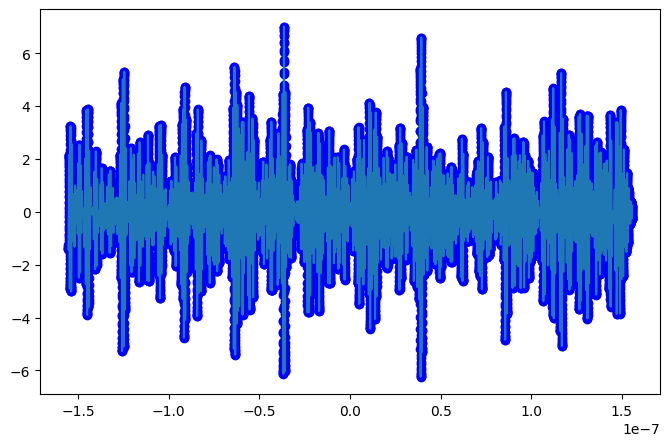

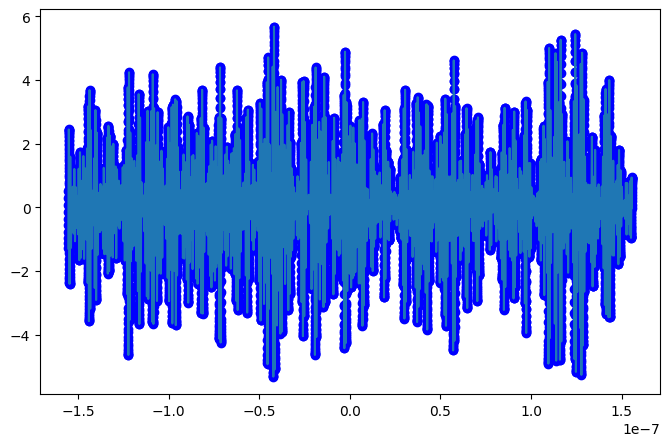

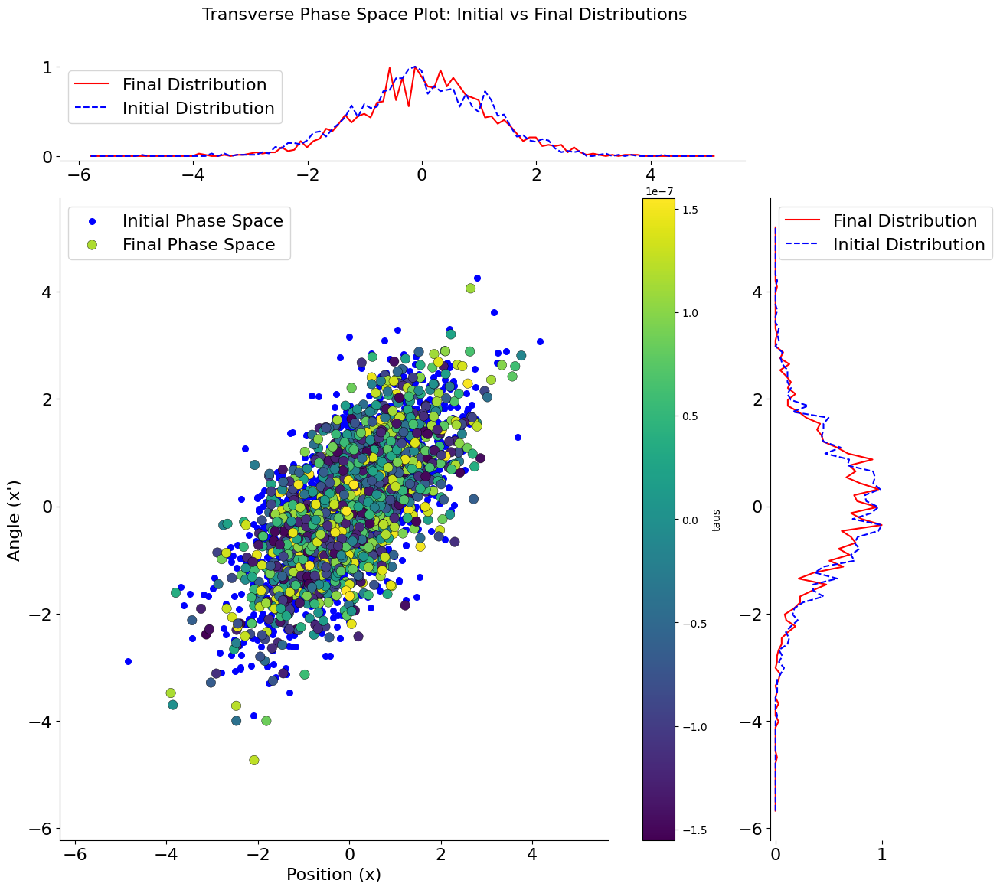

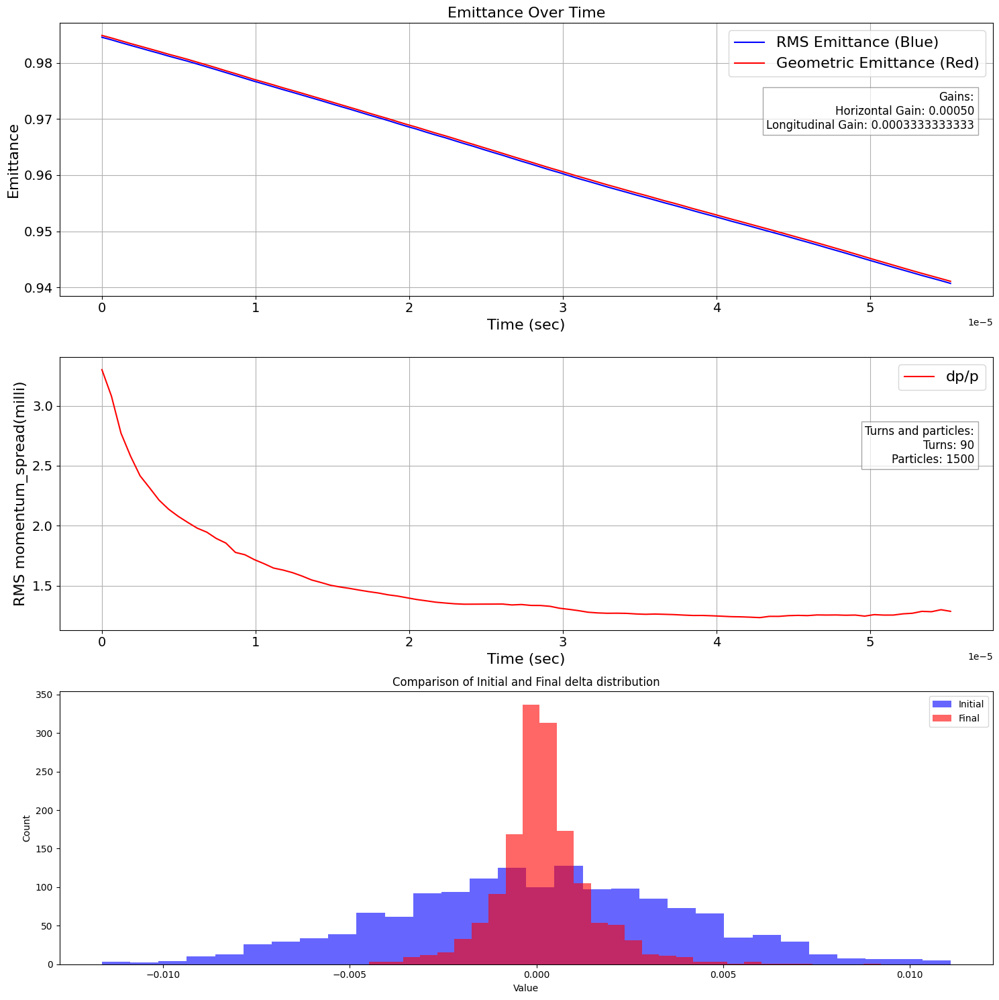

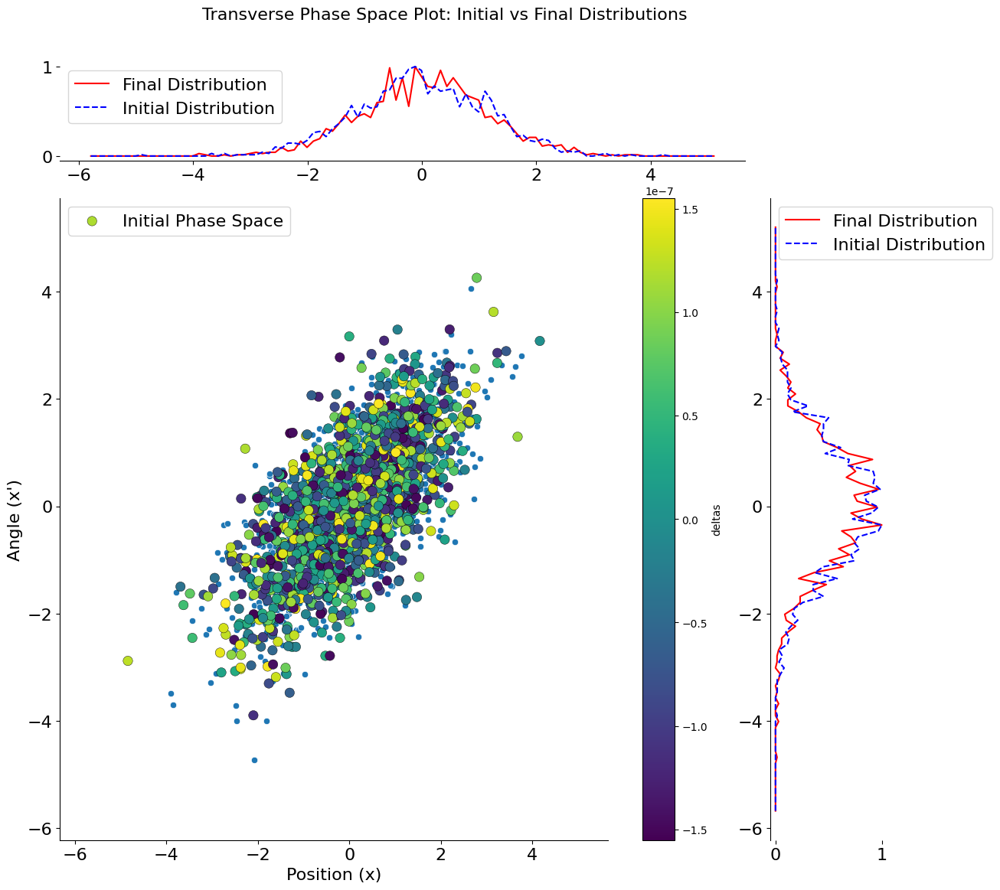

In [139]:
import numpy as np
import math
import matplotlib.pyplot as plt
import time
import scipy as sp
import seaborn as sns
import pandas as pd
from scipy.optimize import curve_fit
import os 

#time delay cooling here!~!!!!!1
#this approach -> bin centers main = only bin centers main
#also cut the time offset ->Th+Dtsamp+Tovlap

#datin  = time.time()  # record start time - to estimate run duration at end


Nparts, Nturns =  1500, 90
betPU, alfPU       =  1.3, -0.9
betK, alfK         =  0.8,  0.6

p_k_r53 = 0.4

gamPU, gamK        =  (1 + alfPU**2)/betPU, (1 + alfK**2)/betK
muPUK, muKPU       =  1.51, 2*np.pi*1.345678 - 1.51
total_angle        =  2*np.pi*1.345678
etaPUK, etaKPU     =  -0.01, -0.01     #eta PUK must be reletevely small, so they dont change slices so fast... 0.02 breaks the system ... It is the limit case!!!! very sensitive on etaPUK --> 2 much unwanted mixing, also etaKPU cant go very low(limit case 0.3) because then the mixing is bad
sigdelt            = 0.004        # rms momentum spread in unit
Th, Trev           =  (620.6e-9)/2, 620.6e-9 #the values now are the actual values of the AD #.1e-6,5e-6# half width of simulation window and revolution period in s
Tovlap, NSamp, add = 4*sigdelt*abs(etaPUK + etaKPU)*Trev, 2500, '2000'
gain               = 5e-4                                   #0.0006777777777777777/2 #s long as I reduce the eta, i have to reduce gains as well... see book
gainL              = 33.33333333e-5               #3.82105263e-06
over_sample_factor = 10
#np.random.seed(54)

def exp_decay(x, A, B, C):
    return A * np.exp(-B * x) + C

"""
wlH, wrH = -1.6e-9, 1.6e-9
def respH(Dt):
    if Dt < 1. * wlH or Dt > 1. * wrH:
        print(f' ===> function respH called with Dt ={1e6*Dt:8.4f}')
    return 0.5 * (1 + np.cos((2 * np.pi / wrH) * Dt))


"""
emittance_individual_particles = np.zeros((Nturns+2, 10))
# definition of the transverse "response function", which is given by the 
#    routine resp for the interval -wlH < Dt < wrH and 0 outside
wlH, wrH = -1.6e-9, 1.6e-9
def respH( Dt ):
   # if Dt < 1.*wlH or Dt > 1.*wrH:
    #    print( f' ===> function respH called with Dt ={1e6*Dt:8.4f}' )
    return (1 - 27e18*Dt**2)*(1 - 3.e18*Dt**2)*(1 - 1.15e18*Dt**2)*(1 - (.625e9*Dt)**2)**7
#   return (1 - 23e16*Dt**2)*(1 - 3.e16*Dt**2)*(1 - 1.15e16*Dt**2)*(1 - (.625e8*Dt)**2)**7
#   return (1 - 25e-12*Dt^2)*(1 - 3e-12*Dt^2)*(1 - 1.15e-12*Dt^2)*(1 - (Dt/1.5)^2)^6

wlL, wrL = -1.6e-9, 1.6e-9
def respL( Dt ):
   # if Dt < 1.*wlL or Dt > 1.*wrL:
    #    print( f' ===> function respL called with Dt ={1e6*Dt:8.4f}' )
    return  (63e9*Dt)*(1 - 6.5e18*Dt**2)*(1 - 1.55e18*Dt**2)*(1 - (.625e9*Dt)**2)**8

#rng = np.random.default_rng(18022005)
rng = np.random.default_rng(22072458)   #this gives us the random seed!!!!

# Total width (particles of both colors) of beam time window is 2*Th ('h' for half)
#  for sampling each sub-window (red or blue) divided into NSamp intervals. This
#  means samp,ing rate DTsamp and NSamp + 1 points. On both ends to be added 
#  ceiling( Tovlap/DTSamp ) points   
DTSamp   = Th/NSamp
NSampext = math.ceil( Tovlap/DTSamp )
inds = np.arange( (-NSampext)*over_sample_factor , (NSamp+1+NSampext + 1)*over_sample_factor )
t_bins = inds*DTSamp/over_sample_factor -Th/2
1
print('========>', NSamp, NSampext, DTSamp, Th, (wrH - wlH)/DTSamp)

def running_average(x, y, bins):
    """
    Compute the running average of y over fixed intervals in x efficiently using NumPy.

    Parameters:
    x (array-like): Array of x-values (sorted or unsorted).
    y (array-like): Array of y-values corresponding to x.
    interval_width (float): The width of the intervals.

    Returns:
    bin_centers (numpy.ndarray): The centers of the bins.
    averages (numpy.ndarray): The average y-values for each bin.
    """
    # Ensure inputs are NumPy arrays
    x = np.array(x)
    y = np.array(y)

    # Bin the data using NumPy digitize
    bin_indices = np.digitize(x, bins) - 1  # Get zero-based bin indices

    # keep only elements within bins
    valid_input_indices = (bin_indices > 0) & (bin_indices < len(bins) - 1)

    # Preallocate array for averages
    averages = np.zeros(len(bins) - 1, dtype=float)
    
    # Use NumPy's bincount for fast bin-based summation and counts
    bin_sums   = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1, weights=y[valid_input_indices])
    bin_counts = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1)
    
    # Avoid division by zero: compute averages where bin_counts > 0
    non_empty_bins = bin_counts > 0
    averages[non_empty_bins] = bin_sums[non_empty_bins] / bin_counts[non_empty_bins]

    # Compute bin centers
    bin_centers = (bins[:-1] + bins[1:]) / 2

    return bin_centers, averages, bin_counts, bin_sums


def TimeTraces(ptsEarly, ptsMain, ptsLate, bins):
    """
    Generate time traces without applying the `Th / 2` offset internally.
    """
    
    ptsEarly = np.array(ptsEarly)
    ptsMain = np.array(ptsMain)
    ptsLate = np.array(ptsLate)
    # Compute histograms of beam distribution
    bin_centers_early, averages_early, count_early, sum_early = running_average(
        ptsEarly[:, 3]-Th, ptsEarly[:, 0], bins
    )
    bin_centers_main, averages_main, count_main, sum_main = running_average(
        ptsMain[:, 3], ptsMain[:, 0], bins
    )
    bin_centers_late, averages_late, count_late, sum_late = running_average(
        ptsLate[:, 3]+Th, ptsLate[:, 0], bins
    )
    
    '''
    
    count_early = count_early.astype(float)
    count_main  = count_main.astype(float)
    count_late  = count_late.astype(float)
 

 
     # Add Gaussian noise (1% of RMS of the sum values) i.e. electronic noise (longitudinal first, error in the time of flight)
    for counts in [count_early, count_main, count_late]:
        #rms_value = np.sqrt(np.mean(sums**2))
        rms_value = 0.001
        noise = np.random.normal(0,  rms_value, size=counts.shape)
        counts += noise
'''

    # Compute time traces
    TraceH_early = np.convolve(respH_new_once, sum_early, 'same')
    TraceH_main = np.convolve(respH_new_once, sum_main, 'same')
    TraceH_late = np.convolve(respH_new_once, sum_late, 'same')
    
    TraceL_early = np.convolve(respL_new_once, count_early, 'same')
    TraceL_main = np.convolve(respL_new_once, count_main, 'same')
    TraceL_late = np.convolve(respL_new_once, count_late, 'same')

    TraceH = TraceH_early + TraceH_main + TraceH_late
    TraceL = TraceL_early + TraceL_main + TraceL_late #i am multiplying with this factor in order to amplify the signal!!!!!
    
    
    
    return bin_centers_main, TraceH, TraceL

# Routine to do do the exchange of .. ended up by regrouping from scratch
def PartsExchange( ptsEarly, ptsLate ):
    ptsEarlyNew, ptsLateNew = [], []
    for x, xp, delt, Tau in ptsEarly:
        if Tau < Th/2:  # should remain in "early group
            ptsEarlyNew += [ [x, xp, delt, Tau] ]
        else:
            ptsLateNew += [ [x, xp, delt, Tau - Th] ]
    for x, xp, delt, Tau in ptsLate:
        if Tau > -Th/2:
            ptsLateNew += [ [x, xp, delt, Tau] ]
        else:
            ptsEarlyNew += [ [x, xp, delt, Tau + Th] ]
    return ptsEarlyNew, ptsLateNew

# Routine to generate time traces

'''
def TimeTraces( ptsEarly, ptsMain, ptsLate ):
    TraceH = [ 0. for _ in range(NSamp + 1 + 2*NSampext) ]
    TraceL = [ 0. for _ in range(NSamp + 1 + 2*NSampext) ]
#   first generate transverse trace
    for x, xp, delt, Tau in ptsEarly:    #precious slice than the one under investigation
        for ind in range( max(-NSampext, math.ceil((wlH+Tau-Th+Th/2)/DTSamp)), 
                          min(NSamp+1+NSampext, math.ceil((wrH+Tau-Th+Th/2)/DTSamp)) ):
            TraceH[ind] += x*respH(ind*DTSamp -Th/2- (Tau-Th) )
    for x, xp, delt, Tau in ptsMain:     #slice under investigation
    for x, xp, delt, Tau in ptsLate:       #next slice un h) )
        for ind in range( max(-NSampext, math.ceil((wlH+Tau+Th+Th/2)/DTSamp)), 
                          min(NSamp+1+NSampext, math.ceil((wrH+Tau+Th+Th/2)/DTSamp)) ):
            TraceH[ind] += x*respH(ind*DTSamp -Th/2- (Tau+Th) )
    for x, xp, delt, Tau in ptsEarly:
        for ind in range( max(-NSampext, math.ceil((wlL+Tau-Th+Th/2)/DTSamp)), 
                          min(NSamp+1+NSampext, math.ceil((wrL+Tau-Th+Th/2)/DTSamp)) ):
            TraceL[ind] += respL(ind*DTSamp -Th/2- (Tau-Th) )
    for x, xp, delt, Tau in ptsMain:
        for ind in range( max(-NSampext, math.ceil((wlL+Tau+Th/2)/DTSamp)), 
                          min(NSamp+1+NSampext, math.ceil((wrL+Tau+Th/2)/DTSamp)) ):
            TraceL[ind] += respL(ind*DTSamp -Th/2- Tau )
    for x, xp, delt, Tau in ptsLate:
        for ind in range( max(-NSampext, math.ceil((wlL+Tau+Th+Th/2)/DTSamp)), 
                          min(NSamp+1+NSampext, math.ceil((wrL+Tau+Th+Th/2)/DTSamp)) ):
            TraceL[ind] += respL(ind*DTSamp -Th/2- (Tau+Th) )
    return TraceH, TraceL

'''

def kickH(pts, signalH):
    corrected_pts = []
    for x, xp, delt, Tau in pts:
        # Interpolate signalH at the particle's Tau
        signal_value = signalH(Tau)
        # Correct xp using the signal value (define your correction logic)
        corrected_xp = xp +gain * signal_value  # I add the signal!!!!!
        # Append the updated particle to the new list
        corrected_pts.append([x, corrected_xp, delt, Tau])
    return corrected_pts

def kickL(pts, signalL):
    corrected_pts = []
    for x, xp, delt, Tau in pts:
        # Interpolate signalL at the particle's Tau
        signal_value = signalL(Tau)
       
        # Correct xp using the signal value (define your correction logic)
        corrected_delt = delt + gainL * signal_value    # Example: subtracting scaled signal
        # Append the updated particle to the new list
        corrected_pts.append([x, xp, corrected_delt, Tau])
    return corrected_pts

respH_new_once = respH(np.arange(wlH, wrH, DTSamp/over_sample_factor ))
respL_new_once = respL(np.arange(wlL, wrL, DTSamp/over_sample_factor ))
# Computation of transverse transfer matrix elements
projPU11 =  betPU**(1/2)
projPU21 = -alfPU/betPU**(1/2)
projPU22 =  1/betPU**(1/2)

matPUK11 = ((betK/betPU)**(1/2))*(np.cos(muPUK) + alfPU*np.sin(muPUK))
matPUK12 = ((betPU*betK)**(1/2))*np.sin(muPUK)
matPUK21 = ((alfPU-alfK)*np.cos(muPUK) - (1+alfPU*alfK)*np.sin(muPUK))/((betPU*betK)**(1/2))
matPUK22 = ((betPU/betK)**(1/2))*(np.cos(muPUK) - alfK*np.sin(muPUK))

matKPU11 = ((betPU/betK)**(1/2))*(np.cos(muKPU) + alfK*np.sin(muKPU))
matKPU12 = ((betPU*betK)**(1/2))*np.sin(muKPU)
matKPU21 = ((alfK-alfPU)*np.cos(muKPU) - (1+alfPU*alfK)*np.sin(muKPU))/((betPU*betK)**(1/2))
matKPU22 = ((betK/betPU)**(1/2))*(np.cos(muKPU) - alfPU*np.sin(muKPU))

# Generate macroparticles in two groups with red ones and blue ones
#    .. say we start with red particles the early ones
ptsRed  = []
ptsBlue = []
for _ in range(Nparts):
    Tau = rng.uniform(-Th, Th)
    xn, xpn, deltn = rng.normal(0., 1.), rng.normal(0., 1.), rng.normal(0., 1.)
    deltn=rng.normal(0., 1.)
    while abs(deltn) > 3.:
        deltn = rng.normal(0., 1.)
    if Tau < 0: 
        ptsRed += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                     deltn*sigdelt, Tau + Th/2] ]
    else:
        ptsBlue += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                      deltn*sigdelt, Tau - Th/2] ]


emittance=np.zeros(Nturns+2)
geo_emittance=np.zeros(Nturns+2)
rms_momentum_spread=np.zeros(Nturns+2)
beam=[]
xp_beam=[]
x_beam=[]
beam=ptsRed+ptsBlue
beam = np.array(beam)
x_beam=beam[:,0]
xp_beam=beam[:,1]
x_initial=x_beam
xp_initial=xp_beam
tau_initial=beam[:,3]
delt_initial=beam[:,2]
counts_initial, bins_initial = np.histogram(delt_initial, bins=30)
emittance[0]=np.sqrt(np.mean(x_initial**2)*np.mean(xp_initial**2)-np.mean(x_initial*xp_initial)**2)   
geo_emittance[0]=((gamPU*np.mean(x_initial**2)+2*alfPU*np.mean(x_initial*xp_initial)+betPU*np.mean(xp_initial**2)))/2
#emittance_individual_particles[0][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
rms_momentum_spread[0]=np.sqrt(np.mean(delt_initial**2)-np.mean(delt_initial)**2)


############################################################
## Track particles from pickup to kicker for the first time, 
## then to pickup again but without kicks. So everything is ready...
############################################################
ptsRedprev = ptsRed
ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]

# Prepare for tracking of blue particles and track them once around
ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed )
ptsBlueprev = ptsBlue
time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins )

ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]  # no action at kicker
#ptsBlue=kickH(ptsBlue,cs)
ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsBlue]
TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
# Prepare for 2nd tracking of red particles and track them once around
ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue )
ptsRedprev = ptsRed

time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins )
#cs = sp.interpolate.CubicSpline( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
 #                 TrHRed[-NSampext:] + TrHRed[:NSamp + 1 + NSampext] )
ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
#ptsRed=kickH(ptsRed,cs)
ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]
TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
# Now the blue ones are early - now just enter loop over number of turns
#   later - for longitudinal filter cooling - some more tracking will be needed


beam=[]
xp_beam=[]
x_beam=[]
beam=ptsRed+ptsBlue
beam = np.array(beam)
x_beam=beam[:,0]
xp_beam=beam[:,1]
dtl_beam=beam[:,2]
emittance[1]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2) 
#emittance_individual_particles[1][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
rms_momentum_spread[1]=np.sqrt(np.mean(dtl_beam**2)-np.mean(dtl_beam)**2)


############################################################
## Start real simulation turn by turn, with cooling
############################################################


# Now we can go in loop and even implement transverse cooling or longitudinal time delay cooling (but not filter)
for turn in range(Nturns):
    #print(f' turn {turn:5d} after {(time.time() - datin):8.2f} s <===')
#   Get ready for the blue particles to be tracked and track them to kicker
    ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed )
    ptsBlueprev, TrLBlueprev = ptsBlue, TrLBlue  # Keep longitudinal trace to add filter cooling later
    time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins )
    TrLDiffBlue = [h - l for h, l in zip(TrLBlue_prev, TrLBlue)]
    cs = sp.interpolate.CubicSpline( time2, 
                  TrHBlue )
    csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffBlue) )
    #cs = sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrHBlue[-NSampext:] + TrHBlue[:NSamp + 1 + NSampext] )
    #csL=sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrLBlue[-NSampext:] + TrLBlue[:NSamp + 1 + NSampext] )

    #print(len(TrHBlue))
    ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                 Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]
#   One day cooling to be applied -  now just dump time traces instead
    ptsBlue=kickH(ptsBlue,cs)
    ptsBlue=kickL(ptsBlue,csL)
#   track the blue one further to the PU

    kicks = np.random.normal(loc=0, scale=0.05 * sigdelt, size=len(ptsBlue))
    ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt,                  #+kick, 
                 Tau + etaKPU*(delt)*Trev] for x, xp, delt, Tau in ptsBlue ]    #      delt+kick            ,for (x, xp, delt, Tau),kick in zip(ptsBlue,kicks) ]     #+(3.033e-10/2)*x-(2.14e-10/2)*xp
    TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
#   Get ready for the red particles to be tracked and track them to kicker
    ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue )
    ptsRedprev, TrLRedprev = ptsRed, TrLRed  # Keep longitudinal trace to add filter cooling later
    time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins )
    TrLDiffRed = [h - l for h, l in zip(TrLRed_prev, TrLRed)]
    cs = sp.interpolate.CubicSpline( time2, 
                  TrHRed )
    csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffRed) )
    
    y_cs = cs(time2)
    y_csL = csL(time2)
    #print("Spline Knots:", cs.x)  # Knots where the spline pieces join
    #print("Spline Coefficients:", cs.c)  # Coefficients of the spline pieces
   
    tauPU=[]
    xPU=[]
    beam=ptsRed
    beam = np.array(beam)
    tauPU=beam[:,3]
    xPU=beam[:,0]
    
    if turn==0:
     plt.figure(figsize=(8, 5))
     plt.plot(time2, y_cs, label="TrHRed Interpolated", linestyle="-")
     #plt.plot(t_smooth, y_csL, label="TrLDiffRed Interpolated", linestyle="--")
     plt.scatter(time2, TrHRed, marker="o", color="blue", label="horizontal signal")
     #plt.scatter(tauPU, xPU, zorder=5, color="red", label="position of particles")

    
# Plot the spline
    if turn==Nturns-1:
     plt.figure(figsize=(8, 5))
     plt.plot(time2, y_cs, label="TrHRed Interpolated", linestyle="-")
     #plt.plot(t_smooth, y_csL, label="TrLDiffRed Interpolated", linestyle="--")
     plt.scatter(time2, TrHRed, marker="o", color="blue", label="horizontal signal")
     #plt.scatter(tauPU, xPU, zorder=5, color="red", label="position of particles")

     
    ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]
#   One day cooling(s) to be applied - now just dump time traces instead
    ptsRed=kickH(ptsRed,cs)
    ptsRed=kickL(ptsRed,csL)   #time of flight method longitudinal cooling
#   track the red ones further to the PU, where they will be the late ones
    #kicks = np.random.normal(loc=0, scale=0.05 * sigdelt, size=len(ptsRed))


    ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, # +kick, 
                Tau + etaKPU*(delt)*Trev] for x, xp, delt, Tau in ptsRed ]  #    delt+kick,     for (x, xp, delt, Tau),kick in zip(ptsRed,kicks)
               
    TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
    beam=[]
    xp_beam=[]
    x_beam=[]
    delta_beam=[]
    dlt_final=[]
    tau_final=[]
    beam=ptsRed+ptsBlue
    beam = np.array(beam)
    x_beam=beam[:,0]
    xp_beam=beam[:,1]
    delta_beam=beam[:,2]
    tau_final=beam[:,3]
    dlt_final=beam[:,2]
    counts_final, bins_final = np.histogram(dlt_final, bins=30)
    emittance[turn+2]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2)
    geo_emittance[turn+2]=(gamPU*np.mean(x_beam**2)+2*alfPU*np.mean(x_beam*xp_beam)+betPU*np.mean(xp_beam**2))/2
    rms_momentum_spread[turn+2]=np.sqrt(np.mean(delta_beam**2)-np.mean(delta_beam)**2)
    #emittance_individual_particles[turn+2][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2

print(f'The initial emittance is {emittance[0]}{chr(0x03C0)} mm*mrad')
print(f'The final emittance after cooling is {emittance[-1]}{chr(0x03C0)} mm*mrad')
print(f'Is emittance reduced? -->  {emittance[-1] < emittance[0]}')
if emittance[-1] < emittance[0]:
  print(f"Emittance is reduced by {(emittance[0] - emittance[-1]) * 100 / emittance[0]}%")
print(f'The initial rms_momentum_spread is {rms_momentum_spread[0]} ')
print(f'The final rms_momentum_spread after cooling is {rms_momentum_spread[-1]} ')
print(f'Is rms_momentum_spread reduced? -->  {rms_momentum_spread[-1] < rms_momentum_spread[0]}')
if rms_momentum_spread[-1] < rms_momentum_spread[0]:
  print(f"rms_momentum_spread is reduced by {(rms_momentum_spread[0] - rms_momentum_spread[-1]) * 100 / rms_momentum_spread[0]}%")



min_x = min(np.min(x_beam), np.min(x_initial))
max_x= max(np.max(x_beam), np.max(x_initial))
min_xp = min(np.min(xp_beam), np.min(xp_initial))
max_xp= max(np.max(xp_beam), np.max(xp_initial))
# Define more extended bin edges to ensure full coverage
bins_x = np.linspace(min_x - 1, max_x + 1, 100)  
bins_xp = np.linspace(min_xp - 1, max_xp + 1, 100)  
# Plot the jointplot

g = sns.jointplot(x=x_beam, y=xp_beam, kind="scatter", height=8, marginal_kws={'color': 'blue'})

# Initial phase space — lower zorder
g.ax_joint.scatter(x_initial, xp_initial, color='blue', s=30, label='Initial Phase Space', zorder=1)

# Final phase space — colored by delta
sc = g.ax_joint.scatter(x_beam, xp_beam, c=tau_final, cmap='viridis', s=80, edgecolor='black', linewidth=0.3,
                        label='Final Phase Space', zorder=2)

# Annotations
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='blue', zorder=3)
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='red', zorder=3)

# Colorbar for delta
plt.colorbar(sc, ax=g.ax_joint, label='taus')

# Optional: adjust margins if needed
plt.tight_layout()
'''
g = sns.jointplot(x=x_beam, y=xp_beam, kind="scatter", color="red", marginal_kws={'color': 'blue'})

# Plot initial phase space first (blue), lower zorder
g.ax_joint.scatter(x_initial, xp_initial, color='blue', s=10, label='Initial Phase Space', zorder=1)

# Plot final phase space after (red), higher zorder
g.ax_joint.scatter(x_beam, xp_beam, color='red', s=30, edgecolor='black', linewidth=0.5,
                   label='Final Phase Space', zorder=2)

# Annotate points
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='blue', zorder=3)
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='red', zorder=3)
'''
'''
# Add scatter points
g.ax_joint.scatter(x_beam, xp_beam, color='red', s=10, label='Final Phase Space')
g.ax_joint.scatter(x_initial, xp_initial, color='blue', s=10, label='Initial Phase Space')

# Annotate points
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10), ha='center', color='blue')
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10), ha='center', color='red')
'''
# Calculate histograms for x
hist_x_final, bin_edges_x_final = np.histogram(x_beam, bins=bins_x)
hist_x_initial, bin_edges_x_initial = np.histogram(x_initial, bins=bins_x)

# Calculate histograms for xp
hist_xp_final, bin_edges_xp_final = np.histogram(xp_beam, bins=bins_xp)
hist_xp_initial, bin_edges_xp_initial = np.histogram(xp_initial, bins=bins_xp)

# Smooth histograms
#hist_x_final = gaussian_filter1d(hist_x_final, sigma=2)
#hist_x_initial = gaussian_filter1d(hist_x_initial, sigma=2)
#hist_xp_final = gaussian_filter1d(hist_xp_final, sigma=2)
#hist_xp_initial = gaussian_filter1d(hist_xp_initial, sigma=2)

# Calculate bin centers for x
bin_centers_x = (bin_edges_x_final[:-1] + bin_edges_x_final[1:]) / 2

# Calculate bin centers for xp
bin_centers_xp = (bin_edges_xp_final[:-1] + bin_edges_xp_final[1:]) / 2

# Remove existing bars on the marginal axes
g.ax_marg_x.clear()
g.ax_marg_y.clear()
g.ax_joint.legend(loc='upper left', fontsize=16)
# Plot the smoothed marginal distributions as lines for x
g.ax_marg_x.plot(bin_centers_x, hist_x_final / max(hist_x_final), color='red', label='Final Distribution', linestyle='-')
g.ax_marg_x.plot(bin_centers_x, hist_x_initial / max(hist_x_initial), color='blue', label='Initial Distribution', linestyle='--')

# Plot the smoothed marginal distributions as lines for xp
g.ax_marg_y.plot(hist_xp_final / max(hist_xp_final), bin_centers_xp, color='red', label='Final Distribution', linestyle='-')
g.ax_marg_y.plot(hist_xp_initial / max(hist_xp_initial), bin_centers_xp, color='blue', label='Initial Distribution', linestyle='--')

# Add legends to marginal plots
g.ax_marg_x.legend(loc='upper left',fontsize=16)
g.ax_marg_y.legend(loc='upper left',fontsize=16)


g.ax_joint.tick_params(axis='both', labelsize=16)  # For joint axis
g.ax_marg_x.tick_params(axis='both', labelsize=16)  # For x marginal axis
g.ax_marg_y.tick_params(axis='both', labelsize=16)  # For y marginal axis
# Set axis labels
g.set_axis_labels('Position (x)', 'Angle (x\')', fontsize=16)

# Adjust the figure size and spacing
g.fig.set_size_inches(12, 12)
g.fig.subplots_adjust(top=0.92)

# Set a title
plt.suptitle('Transverse Phase Space Plot: Initial vs Final Distributions', fontsize=16)


fig, ( ax2,  ax4,ax5) = plt.subplots(
    3, 1, figsize=(15, 15)
)
'''
# First plot: Phase Space
ax1.scatter(x_initial, xp_initial, color='blue', s=2, label='First Element')
ax1.scatter(x_beam, xp_beam, color='red', s=2, label='Last Element')
ax1.annotate('First', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10), ha='center', color='blue')
ax1.annotate('Last', 
             (x_beam[-1], xp_beam[-1]), 
             textcoords="offset points", 
             xytext=(0, 10), 
             ha='center', 
             color='red')

ax1.set_xlabel('Position (x)')
ax1.set_ylabel("Angle (x')")
ax1.set_title('Phase Space')
ax1.grid(True)
#ax1.set_aspect('equal', adjustable='box')

#ax1.set_xlim(min(x_initial.min(), x_beam.min()) - 0.5, max(x_initial.max(), x_beam.max()) + 0.5)
#ax1.set_ylim(min(xp_initial.min(), xp_beam.min()) - 0.5, max(xp_initial.max(), xp_beam.max()) + 0.5)

# Adjust axis limits to avoid overlap with histograms
ax1_hist_x = ax1.twiny()  # This creates a second x-axis for plotting x histogram
ax1_hist_x.hist(x_beam, bins=20, color='blue', alpha=0.3, label='Distribution of x', orientation='vertical')
ax1_hist_x.set_xlabel('Distribution of x')

# Histogram for xp (Angle) on ax1 (left)
ax1_hist_y = ax1.twinx()  # This creates a second y-axis for plotting xp histogram
ax1_hist_y.hist(xp_beam, bins=20, color='green', alpha=0.3, label='Distribution of xp', orientation='horizontal')
ax1_hist_y.set_ylabel('Distribution of xp')

# Adjust the placement of the histograms
ax1_hist_x.set_xlim(200)  # Match the x-limits of the phase space plot
ax1_hist_y.set_ylim(200)  # Match the y-limits of the phase space plot

# Add legends for histograms
ax1_hist_x.legend(loc='upper left')
ax1_hist_y.legend(loc='upper right')


# Add a legend

'''
# Second plot: Emittance vs Turns
pa = np.arange(0, Nturns ) * total_angle


# Plot RMS Emittance (Blue Curve)
ax2.plot(pa / total_angle*Trev, emittance[2:], label='RMS Emittance (Blue)', color='blue')

# Plot Geometric Emittance (Red Curve)
ax2.plot(pa / total_angle*Trev, geo_emittance[2:], label='Geometric Emittance (Red)', color='red')

# Add labels and title
ax2.set_xlabel('Time (sec)', fontsize=16)
ax2.set_ylabel('Emittance', fontsize=16)
ax2.set_title('Beam Emittance Over Turns', fontsize=16)
ax2.grid(True)
# Add a legend
ax2.legend(loc='upper right', fontsize=16)
gains_text = f"Gains:\nHorizontal Gain: {gain:.5f}\nLongitudinal Gain: {gainL}"
ax2.text(0.98, 0.75, gains_text,  # Adjust the y-coordinate to position below the legend
         transform=ax2.transAxes,  # Relative to the axes (0=left, 1=right)
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))  # Optional box for visibility

ax2.tick_params(axis='both', labelsize=14)
rms_momentum_spread[turn+2]




'''
ax3.scatter(tau_initial, delt_initial, color='blue', s=2, label='First Element')
ax3.scatter(tau_final, dlt_final, color='red', s=2, label='Last Element')
ax3.annotate('First', (tau_initial[0], delt_initial[0]), textcoords="offset points", xytext=(0, 10), ha='center', color='blue')
ax3.annotate('Last', (tau_final[-1], dlt_final[-1]), textcoords="offset points", xytext=(0, 10),ha='center', color='red')  
# Set axis labels and title for the scatter plot
'''


# Plot Geometric Emittance (Red Curve)
ax4.plot(pa / total_angle *Trev, rms_momentum_spread[2:]*1000, label='dp/p', color='red')

# Add labels and title
ax4.set_xlabel('Time (sec)', fontsize=16)
ax4.set_ylabel('RMS momentum_spread(milli)', fontsize=16)
ax2.set_title('Emittance Over Time', fontsize=16)
ax4.grid(True)
# Add a legend
ax4.legend(loc='upper right', fontsize=16)
N_text = f"Turns and particles:\nTurns: {Nturns}\nParticles: {Nparts}"
ax4.text(0.98, 0.75, N_text,  # Adjust the y-coordinate to position below the legend
         transform=ax4.transAxes,  # Relative to the axes (0=left, 1=right)
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))  # Optional box for visibility

ax4.tick_params(axis='both', labelsize=14)



ax5.bar(bins_initial[:-1], counts_initial, width=np.diff(bins_initial), 
        alpha=0.6, color='b', label='Initial', align='edge')

ax5.bar(bins_final[:-1], counts_final, width=np.diff(bins_final), 
        alpha=0.6, color='r', label='Final', align='edge')

# Add labels, title, and legend
ax5.set_xlabel("Value")
ax5.set_ylabel("Count")
ax5.set_title("Comparison of Initial and Final delta distribution")
ax5.legend()

fig.tight_layout()


min_x = min(np.min(x_beam), np.min(x_initial))
max_x= max(np.max(x_beam), np.max(x_initial))
min_xp = min(np.min(xp_beam), np.min(xp_initial))
max_xp= max(np.max(xp_beam), np.max(xp_initial))
# Define more extended bin edges to ensure full coverage
bins_x = np.linspace(min_x - 1, max_x + 1, 100)  
bins_xp = np.linspace(min_xp - 1, max_xp + 1, 100)  
# Plot the jointplot

g = sns.jointplot(x=x_beam, y=xp_beam, kind="scatter", height=8, marginal_kws={'color': 'blue'})

# Initial phase space — lower zorder
g.ax_joint.scatter(x_initial, xp_initial, c=tau_initial, cmap='viridis', s=80, edgecolor='black', label='Initial Phase Space',linewidth=0.3, zorder=2)

# Final phase space — colored by delta
#sc = g.ax_joint.scatter(x_beam, xp_beam, c=dlt_final, cmap='viridis', s=80, edgecolor='black', linewidth=0.3,
                       # label='Final Phase Space', zorder=2)

# Annotations
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='blue', zorder=3)
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='red', zorder=3)

# Colorbar for delta
plt.colorbar(sc, ax=g.ax_joint, label='deltas')

# Optional: adjust margins if needed
plt.tight_layout()
'''
g = sns.jointplot(x=x_beam, y=xp_beam, kind="scatter", color="red", marginal_kws={'color': 'blue'})

# Plot initial phase space first (blue), lower zorder
g.ax_joint.scatter(x_initial, xp_initial, color='blue', s=10, label='Initial Phase Space', zorder=1)

# Plot final phase space after (red), higher zorder
g.ax_joint.scatter(x_beam, xp_beam, color='red', s=30, edgecolor='black', linewidth=0.5,
                   label='Final Phase Space', zorder=2)

# Annotate points
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='blue', zorder=3)
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10),
                    ha='center', color='red', zorder=3)
'''
'''
# Add scatter points
g.ax_joint.scatter(x_beam, xp_beam, color='red', s=10, label='Final Phase Space')
g.ax_joint.scatter(x_initial, xp_initial, color='blue', s=10, label='Initial Phase Space')

# Annotate points
g.ax_joint.annotate('', (x_initial[0], xp_initial[0]), textcoords="offset points", xytext=(0, 10), ha='center', color='blue')
g.ax_joint.annotate('', (x_beam[-1], xp_beam[-1]), textcoords="offset points", xytext=(0, 10), ha='center', color='red')
'''
# Calculate histograms for x
hist_x_final, bin_edges_x_final = np.histogram(x_beam, bins=bins_x)
hist_x_initial, bin_edges_x_initial = np.histogram(x_initial, bins=bins_x)

# Calculate histograms for xp
hist_xp_final, bin_edges_xp_final = np.histogram(xp_beam, bins=bins_xp)
hist_xp_initial, bin_edges_xp_initial = np.histogram(xp_initial, bins=bins_xp)

# Smooth histogramsH
#hist_x_final = gaussian_filter1d(hist_x_final, sigma=2)
#hist_x_initial = gaussian_filter1d(hist_x_initial, sigma=2)
#hist_xp_final = gaussian_filter1d(hist_xp_final, sigma=2)
#hist_xp_initial = gaussian_filter1d(hist_xp_initial, sigma=2)

# Calculate bin centers for x
bin_centers_x = (bin_edges_x_final[:-1] + bin_edges_x_final[1:]) / 2

# Calculate bin centers for xp
bin_centers_xp = (bin_edges_xp_final[:-1] + bin_edges_xp_final[1:]) / 2

# Remove existing bars on the marginal axes
g.ax_marg_x.clear()
g.ax_marg_y.clear()
g.ax_joint.legend(loc='upper left', fontsize=16)
# Plot the smoothed marginal distributions as lines for x
g.ax_marg_x.plot(bin_centers_x, hist_x_final / max(hist_x_final), color='red', label='Final Distribution', linestyle='-')
g.ax_marg_x.plot(bin_centers_x, hist_x_initial / max(hist_x_initial), color='blue', label='Initial Distribution', linestyle='--')

# Plot the smoothed marginal distributions as lines for xp
g.ax_marg_y.plot(hist_xp_final / max(hist_xp_final), bin_centers_xp, color='red', label='Final Distribution', linestyle='-')
g.ax_marg_y.plot(hist_xp_initial / max(hist_xp_initial), bin_centers_xp, color='blue', label='Initial Distribution', linestyle='--')

# Add legends to marginal plots
g.ax_marg_x.legend(loc='upper left',fontsize=16)
g.ax_marg_y.legend(loc='upper left',fontsize=16)


g.ax_joint.tick_params(axis='both', labelsize=16)  # For joint axis
g.ax_marg_x.tick_params(axis='both', labelsize=16)  # For x marginal axis
g.ax_marg_y.tick_params(axis='both', labelsize=16)  # For y marginal axis
# Set axis labels
g.set_axis_labels('Position (x)', 'Angle (x\')', fontsize=16)

# Adjust the figure size and spacing
g.fig.set_size_inches(12, 12)
g.fig.subplots_adjust(top=0.92)

# Set a title
plt.suptitle('Transverse Phase Space Plot: Initial vs Final Distributions', fontsize=16)



print("Indices of the 10 particles with the largest |δ|:", top_indices)

# Optionally, print the corresponding tau and dlt values
print("Corresponding (τ, δ) values:")
for i in top_indices:
    print(f"Index {i}: (τ = {tau_final[i]}, δ = {dlt_final[i]})")


data_to_save = rms_momentum_spread

# Define path and filename
output_dir = os.path.expanduser("~/2409/scooling/studies/final results")
output_file = os.path.join(output_dir, "rms momentum spread for 1500 particles,NG= 0.5, Nsamp=2500.txt")

# Ensure the directory exists
os.makedirs(output_dir, exist_ok=True)

# Save data
np.savetxt(output_file, data_to_save)

'''
x_data = np.linspace(0,Nturns,Nturns)  # Normalized turns (x-axis)
y_data = rms_momentum_spread[2:] * 1000  # Convert to milli (y-axis)

# Check that we have enough points
if len(x_data) < 2000 or len(y_data) < 2000:
       raise ValueError("Not enough data points for the first 3000 turns.")

# Slice data for the first 3000 turns
x_data_fit = x_data[:2000]
y_data_fit = y_data[:2000]

# Provide initial parameter guesses
initial_guess = [y_data_fit[0], 0.001, min(y_data_fit)]  # A = first y value, small decay rate, C = min y value

# Perform the curve fitting on the first 3000 turns
params, covariance = curve_fit(exp_decay, x_data_fit, y_data_fit, p0=initial_guess ,maxfev=5000)

# Generate fitted curve values for plotting
x_fit = np.linspace(min(x_data_fit), max(x_data_fit), 500)  # Smooth curve within fit range
y_fit = exp_decay(x_fit, *params)

# Plot the data and the fit
fig, ax8 = plt.subplots(figsize=(8, 6))

# Plot the full data
ax8.plot(x_data, y_data, label='dp/p (Data)', color='red', marker='o', linestyle='None', markersize=4)

# Plot the fitted exponential decay curve over the fit region
ax8.plot(x_fit, y_fit, label='Exp. Decay Fit (first 3000 turns)', linestyle="--", color="blue")

# Labels and title
ax8.set_xlabel('Turns (Normalized)', fontsize=16)
ax8.set_ylabel('RMS momentum spread (milli)', fontsize=16)
ax8.set_title('RMS Momentum Spread Over Turns', fontsize=16)
ax8.grid(True)
ax8.legend(loc='upper right', fontsize=14)

# Additional text box for parameters
N_text = f"Turns and particles:\nTurns: {Nturns}\nParticles: {Nparts}"
ax8.text(0.98, 0.75, N_text,
         transform=ax8.transAxes,
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

# Adjust tick label size
ax8.tick_params(axis='both', labelsize=14)

# Show fit parameters
A_fit, B_fit, C_fit = params

# Compute cooling time constant (tau)
tau_longitudinal_cooling = 1 / B_fit
tau_L_real = tau_longitudinal_cooling * Trev

print(f"Cooling time (τ) for RMS momentum spread: {tau_L_real:.6f} sec")    
'''

# Show the plot
#ax5.show()

#print(f'\n\n =======> duration of run{(time.time() - datin):8.2f} s <===\n')

#print(f"Memory usage after operations: {process.memory_info().rss / 1e6} MB")

#print(f'\n\n =======> duration of run{(time.time() - datin):8.2f} s <===\n')

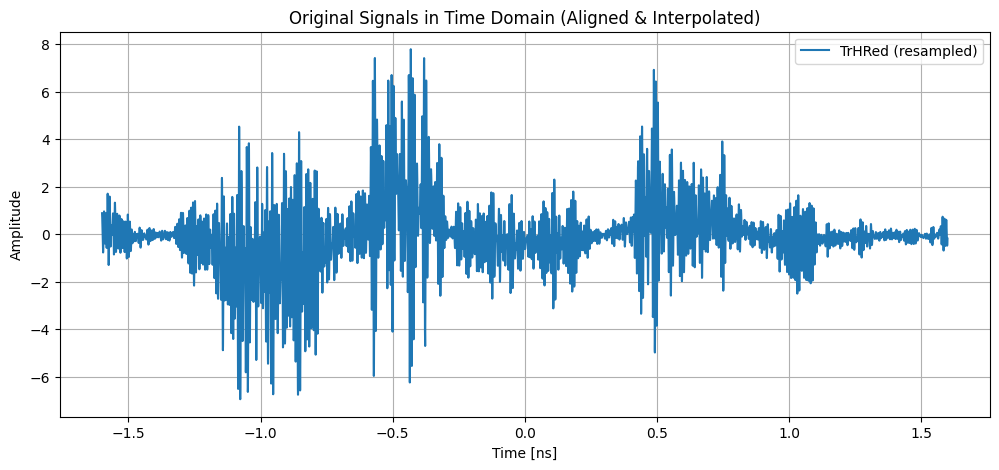

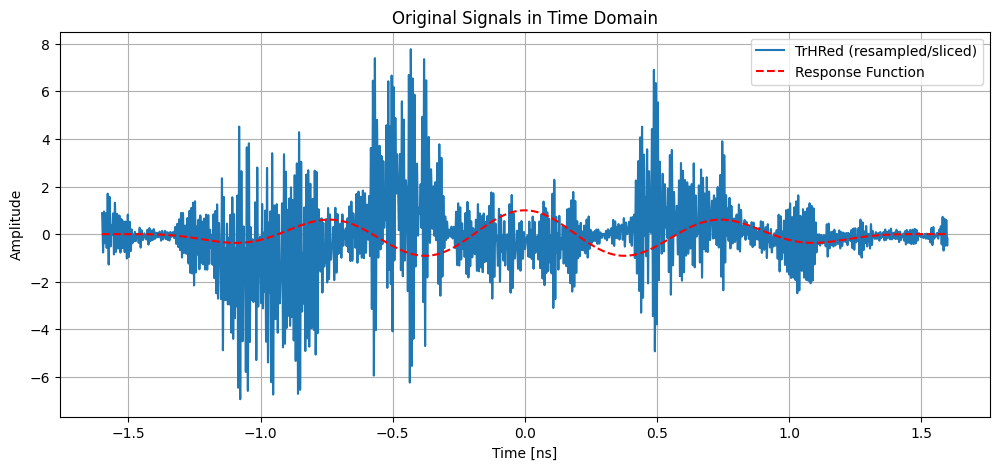

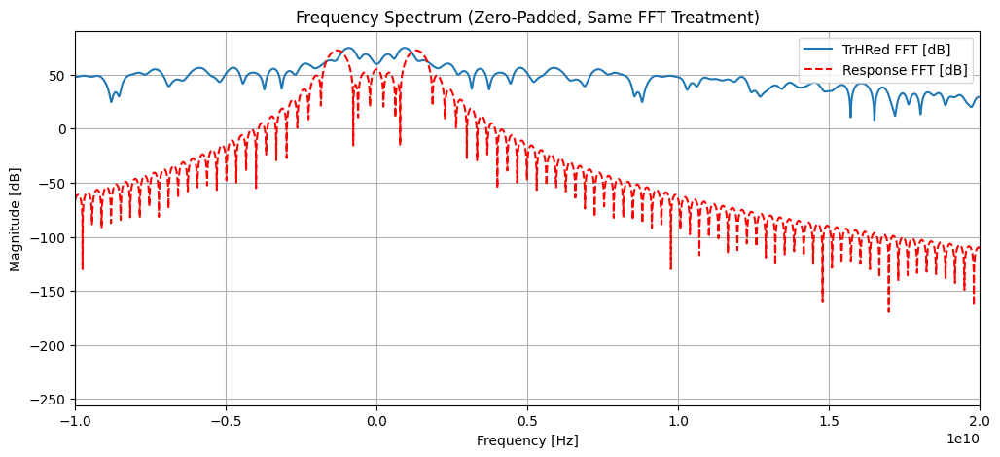

In [36]:
import numpy as np
import matplotlib.pyplot as plt

def my_fft(data, dt, N_fft):
    N_current = len(data)
    pad_total = N_fft - N_current
    pad_left = pad_total // 2
    pad_right = pad_total - pad_left
    data_padded = np.pad(data, (pad_left, pad_right), 'constant')
    
    spectrum = np.fft.fftshift(np.fft.fft(data_padded))
    freqs = np.fft.fftshift(np.fft.fftfreq(N_fft, d=dt))
    return freqs, spectrum

def my_ifft(spectrum, N_original, pad_left, pad_right):
    data_padded = np.fft.ifft(np.fft.ifftshift(spectrum))
    # remove padding
    data_recovered = data_padded[pad_left: pad_left + N_original]
    return np.real(data_recovered)



wlL, wrL = -1.6e-9, 1.6e-9
time_axis = np.linspace(wlL, wrL, 8039)
plt.figure(figsize=(12, 5))
plt.plot(time_axis * 1e9, TrHRed, label='TrHRed (resampled)')


plt.xlabel("Time [ns]")
plt.ylabel("Amplitude")
plt.title("Original Signals in Time Domain (Aligned & Interpolated)")
plt.grid()
plt.legend()
plt.show()
# Parameters for both

n_points = 15000
time_axis = np.linspace(wlL, wrL, n_points)
dt = time_axis[1] - time_axis[0]

# Response function on this axis
response_signal_clean = respH(time_axis)

# For TrHRed: if length differs from n_points, interpolate to exactly n_points
if len(TrHRed) != n_points:
    original_indices = np.linspace(0, 1, len(TrHRed))
    target_indices = np.linspace(0, 1, n_points)
    TrHRed_resampled = np.interp(target_indices, original_indices, TrHRed)
else:
    TrHRed_resampled = TrHRed.copy()

# Plot original signals in time domain


# Zero-padding factor and FFT length
padding_factor = 20
N_original = n_points
N_pad = N_original * padding_factor
N_fft = N_original + 2 * N_pad


plt.figure(figsize=(12, 5))
plt.plot(time_axis * 1e9, TrHRed_resampled, label='TrHRed (resampled/sliced)')
plt.plot(time_axis * 1e9, response_signal_clean, 'r--', label='Response Function')
plt.xlabel('Time [ns]')
plt.ylabel('Amplitude')
plt.title('Original Signals in Time Domain')
plt.legend()
plt.grid()
plt.show()

# FFT both signals with zero-padding
freqs, spectrum_response = my_fft(response_signal_clean, dt, N_fft)
_, spectrum_signal = my_fft(TrHRed_resampled, dt, N_fft)

# Magnitude spectra in dB
magnitude_db_signal = 20 * np.log10(np.abs(spectrum_signal) + 1e-12)
magnitude_db_response = 20 * np.log10(np.abs(spectrum_response) + 1e-12)

# Plot frequency spectra
plt.figure(figsize=(12, 5))
plt.plot(freqs, magnitude_db_signal, label='TrHRed FFT [dB]')
plt.plot(freqs, magnitude_db_response, 'r--', label='Response FFT [dB]')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude [dB]')
plt.title('Frequency Spectrum (Zero-Padded, Same FFT Treatment)')
plt.xlim(-1e10, 2e10)
plt.legend()
plt.grid()
plt.show()

response_recovered = my_ifft(spectrum_response, N_original, pad_left, pad_right)
signal_recovered = my_ifft(spectrum_signal, N_original, pad_left, pad_right)
# Plot recovered vs original
plt.figure(figsize=(14, 5))
plt.plot(time_axis_signal * 1e9, TrHRed_resampled, label='Original TrHRed')
plt.plot(time_axis_signal * 1e9, signal_recovered, '--', label='Recovered TrHRed (iFFT)')
plt.xlabel('Time [ns]')
plt.ylabel('Amplitude')
plt.title('TrHRed: Original vs Recovered')
plt.legend()
plt.grid()
plt.show()

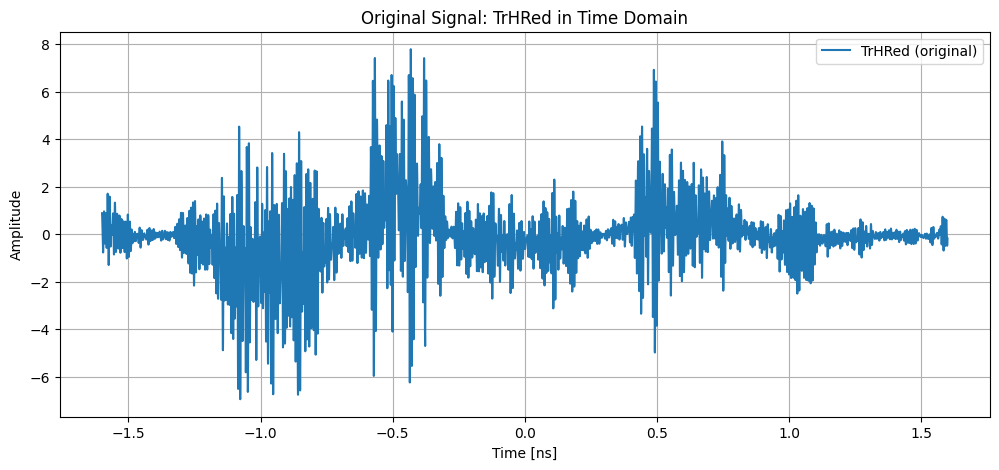

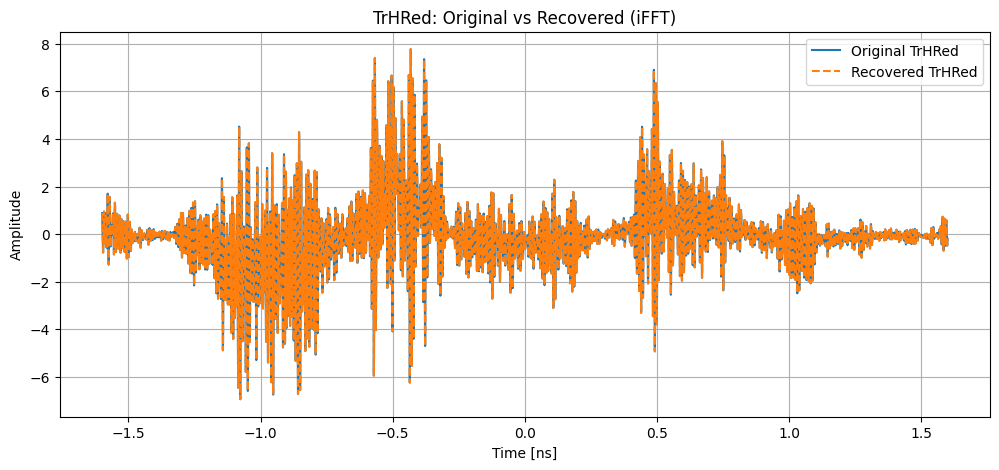

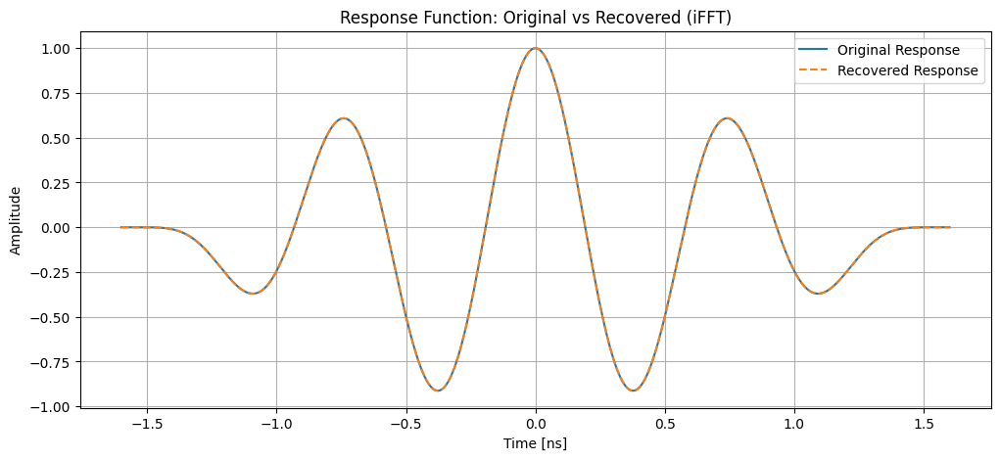

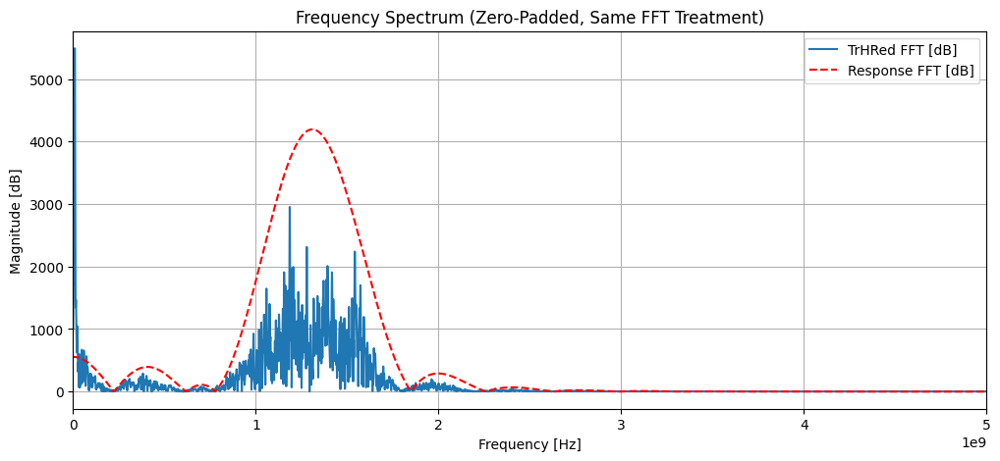

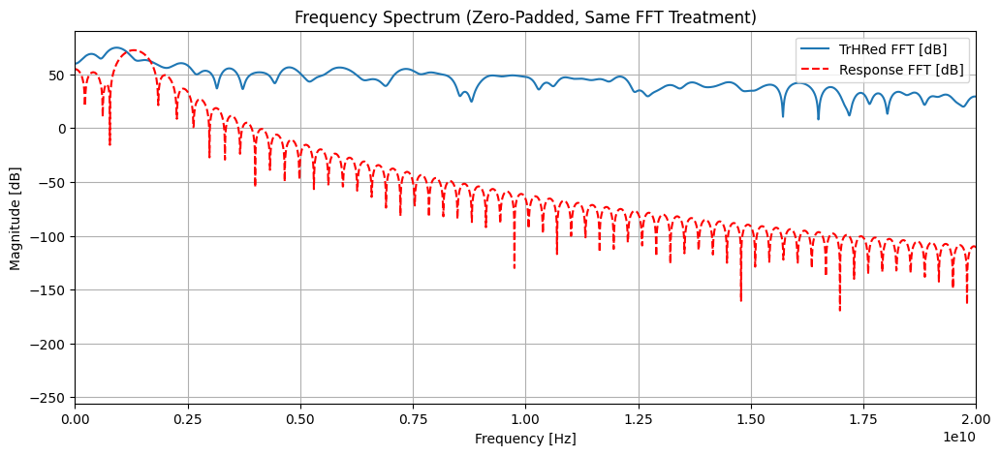

In [51]:
import numpy as np
import matplotlib.pyplot as plt

def my_fft(data, dt, N_fft):
    N_current = len(data)
    pad_total = N_fft - N_current
    pad_left = pad_total // 2
    pad_right = pad_total - pad_left
    data_padded = np.pad(data, (pad_left, pad_right), 'constant')
    
    spectrum = np.fft.fftshift(np.fft.fft(data_padded))
    freqs = np.fft.fftshift(np.fft.fftfreq(N_fft, d=dt))
    return freqs, spectrum, pad_left, pad_right

def my_ifft(spectrum, N_original, pad_left, pad_right):
    data_padded = np.fft.ifft(np.fft.ifftshift(spectrum))
    data_recovered = data_padded[pad_left: pad_left + N_original]
    return np.real(data_recovered)

# Time domain setup
wlL, wrL = -1.6e-9, 1.6e-9
time_axis = np.linspace(wlL, wrL, 8039)
plt.figure(figsize=(12, 5))
plt.plot(time_axis * 1e9, TrHRed, label='TrHRed (original)')
plt.xlabel("Time [ns]")
plt.ylabel("Amplitude")
plt.title("Original Signal: TrHRed in Time Domain")
plt.grid()
plt.legend()
plt.show()

# Common parameters
n_points = 15000
time_axis = np.linspace(wlL, wrL, n_points)
dt = time_axis[1] - time_axis[0]

# Resample signals
response_signal_clean = respH(time_axis)

if len(TrHRed) != n_points:
    original_indices = np.linspace(0, 1, len(TrHRed))
    target_indices = np.linspace(0, 1, n_points)
    TrHRed_resampled = np.interp(target_indices, original_indices, TrHRed)
else:
    TrHRed_resampled = TrHRed.copy()

# Zero-padding factor and FFT length
padding_factor = 20
N_original = n_points
N_pad = N_original * padding_factor
N_fft = N_original + 2 * N_pad

# FFT both signals
freqs, spectrum_response, pad_left, pad_right = my_fft(response_signal_clean, dt, N_fft)
_, spectrum_signal, _, _ = my_fft(TrHRed_resampled, dt, N_fft)

# Recover signals via inverse FFT
response_recovered = my_ifft(spectrum_response, N_original, pad_left, pad_right)
signal_recovered = my_ifft(spectrum_signal, N_original, pad_left, pad_right)

# Plot recovered vs original
plt.figure(figsize=(12, 5))
plt.plot(time_axis * 1e9, TrHRed_resampled, label='Original TrHRed')
plt.plot(time_axis * 1e9, signal_recovered, '--', label='Recovered TrHRed')
plt.xlabel("Time [ns]")
plt.ylabel("Amplitude")
plt.title("TrHRed: Original vs Recovered (iFFT)")
plt.grid()
plt.legend()
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(time_axis * 1e9, response_signal_clean, label='Original Response')
plt.plot(time_axis * 1e9, response_recovered, '--', label='Recovered Response')
plt.xlabel("Time [ns]")
plt.ylabel("Amplitude")
plt.title("Response Function: Original vs Recovered (iFFT)")
plt.grid()
plt.legend()
plt.show()


plt.figure(figsize=(12, 5))
plt.plot(freqs*1e-2, np.abs(spectrum_signal), label='TrHRed FFT [dB]')
plt.plot(freqs, np.abs(spectrum_response), 'r--', label='Response FFT [dB]')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude [dB]')
plt.title('Frequency Spectrum (Zero-Padded, Same FFT Treatment)')
plt.xlim(0, 5e9)
plt.legend()
plt.grid()
plt.show()
# Magnitude spectra in dB
magnitude_db_signal = 20 * np.log10(np.abs(spectrum_signal) + 1e-12)
magnitude_db_response = 20 * np.log10(np.abs(spectrum_response) + 1e-12)

# Plot frequency spectra
plt.figure(figsize=(12, 5))
plt.plot(freqs, magnitude_db_signal, label='TrHRed FFT [dB]')
plt.plot(freqs, magnitude_db_response, 'r--', label='Response FFT [dB]')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude [dB]')
plt.title('Frequency Spectrum (Zero-Padded, Same FFT Treatment)')
plt.xlim(0, 2e10)
plt.legend()
plt.grid()
plt.show()

In [52]:
spectrum_response[np.abs(freqs) < 1e6]=0
#

array([-2.34359375e+12, -2.34358613e+12, -2.34357851e+12, ...,
        2.34357089e+12,  2.34357851e+12,  2.34358613e+12])

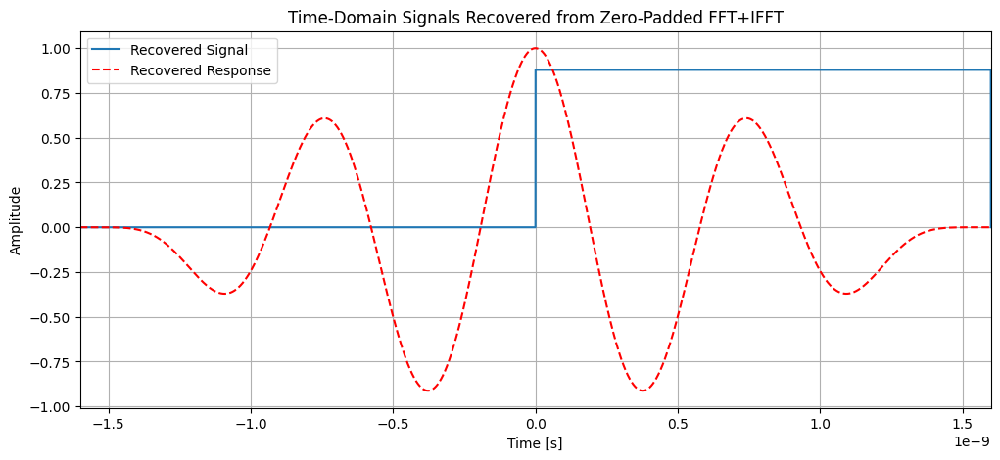

In [23]:
# IFFT both (undoing fftshift)
recovered_response = np.fft.ifft(np.fft.ifftshift(spectrum_response))
recovered_signal = np.fft.ifft(np.fft.ifftshift(spectrum_signal))

# New time axis (same as before)
time_axis_padded = np.linspace(
    wlL - padding_factor * (wrL - wlL),  # start
    wrL + padding_factor * (wrL - wlL),  # end
    N_fft
)

# Plot recovered signals
plt.figure(figsize=(12, 5))
plt.plot(time_axis_padded, np.real(recovered_signal), label='Recovered Signal')
plt.plot(time_axis_padded, np.real(recovered_response), 'r--', label='Recovered Response')
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.title("Time-Domain Signals Recovered from Zero-Padded FFT+IFFT")
plt.xlim(wlL, wrL)
plt.grid()
plt.legend()
plt.show()

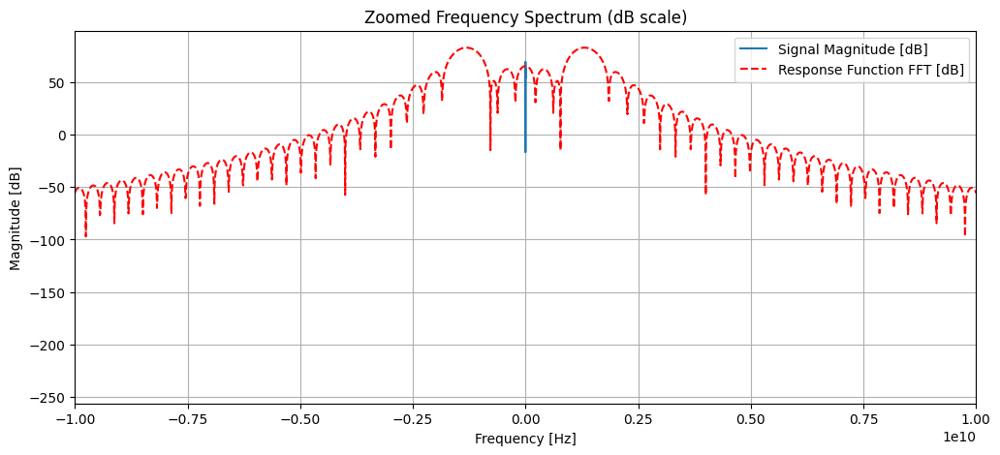

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assume previous definitions...
def my_fft(data, sample_rate=10):
    fftSize = len(data)
    spectrum = np.fft.fft(data)
    freq = np.fft.fftfreq(fftSize, 1/sample_rate)
    return (freq, spectrum)

def my_ifft(spectrum):
    return np.fft.ifft(spectrum)
# Compute FFT
freq, spectrum = my_fft(TrHRed, sample_rate=100000)
magnitude_db = 20 * np.log10(np.abs(spectrum) + 1e-12)




wlL, wrL = -1.6e-9, 1.6e-9
n_f_points = 50000  # << increase this number for finer resolution
time_axis_response = np.linspace(wlL, wrL, n_f_points)

# Evaluate response on this axis
response_signal_clean = respH(time_axis_response)

# Zero padding: append zeros on both sides
padding_factor = 20
zero_padding = np.zeros(len(response_signal_clean) * padding_factor)
response_padded = np.concatenate((zero_padding, response_signal_clean, zero_padding))

# FFT of response function
fftSize_resp = len(response_padded)
spectrum_response = np.fft.fftshift(np.fft.fft(response_padded))
freqs_response = np.fft.fftshift(np.fft.fftfreq(fftSize_resp, d=(time_axis_response[1] - time_axis_response[0])))

# Convert freqs_response from Hz (they’re in Hz already if d is in seconds)
# Since time_axis_response is in seconds → d in seconds → freqs in Hz

# Plot — zoom in a lot
plt.figure(figsize=(12, 5))

# Plot signal FFT in dB
plt.plot(freq, magnitude_db, label="Signal Magnitude [dB]")
plt.plot(freqs_response, 20 * np.log10(np.abs(spectrum_response) + 1e-12), 'r--', label='Response Function FFT [dB]')

# Plot response (rescale to dB if you want or just overlay)
response_db = 20 * np.log10(np.abs(spectrum_response) + 1e-12)
#plt.plot(freqs_response, response_db, 'r--', label='Response Function FFT [dB]')

# Zoom limits
#plt.xlim(-0.0005e11, 0.0005e11)  # adjust this band to zoom wherever you like

plt.xlabel("Frequency [Hz]")
plt.ylabel("Magnitude [dB]")
plt.title("Zoomed Frequency Spectrum (dB scale)")
plt.xlim(-0.01e12, 0.01e12)  # adjust this band to zoom wherever you like
plt.grid()
plt.legend()
plt.show()

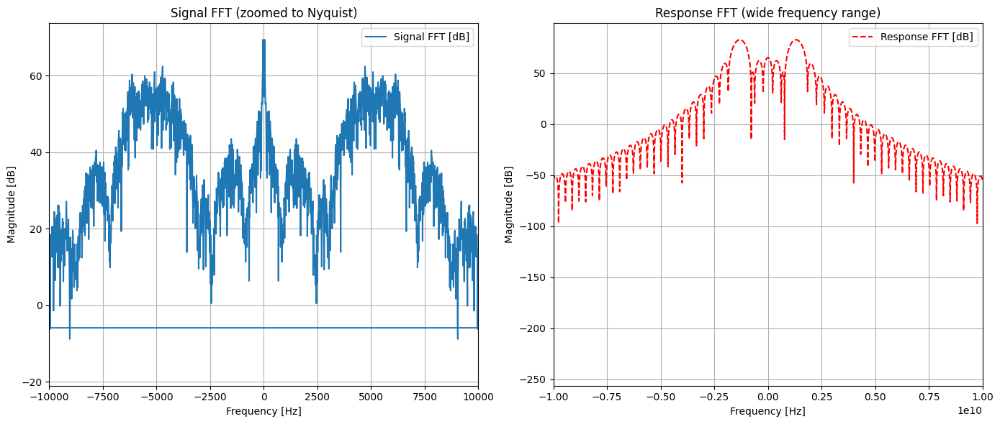

In [115]:
plt.figure(figsize=(14, 6))

# Left: Zoomed-in around signal frequencies (up to Nyquist freq)
plt.subplot(1, 2, 1)
plt.plot(freq, magnitude_db, label="Signal FFT [dB]")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Magnitude [dB]")
plt.title("Signal FFT (zoomed to Nyquist)")
plt.xlim(-0.01e6, 0.01e6)    # up to Nyquist frequency
plt.grid()
plt.legend()

# Right: Zoomed-out for response FFT (very high frequency range)
plt.subplot(1, 2, 2)
plt.plot(freqs_response, 20 * np.log10(np.abs(spectrum_response) + 1e-12), 'r--', label='Response FFT [dB]')
plt.xlabel("Frequency [Hz]")
plt.ylabel("Magnitude [dB]")
plt.title("Response FFT (wide frequency range)")
#plt.xlim(min(freqs_response), max(freqs_response))  # full range
plt.xlim(-0.01e12, 0.01e12)  
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

Sample rate: 25.782 GHz
Revolution frequency: 1.611 MHz
Expected horizontal line at: 0.999 MHz


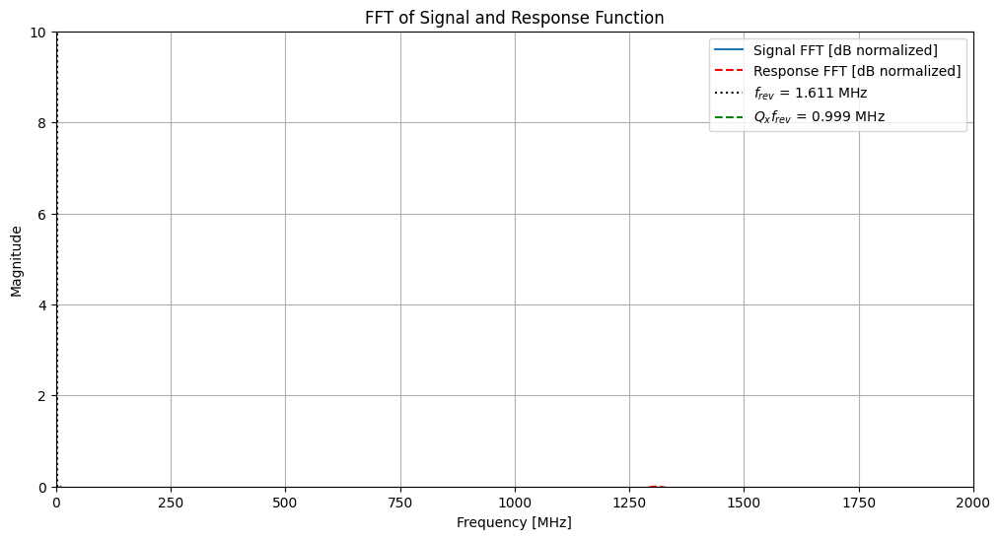

In [100]:
dt = time2[1] - time2[0]
sample_rate = 1 / dt
print(f"Sample rate: {sample_rate/1e9:.3f} GHz")

# FFT functions
def my_fft(data, sample_rate):
    fftSize = len(data)
    spectrum = np.fft.fft(data)
    freq = np.fft.fftfreq(fftSize, 1/sample_rate)
    return (freq, spectrum)

def my_ifft(spectrum):
    return np.fft.ifft(spectrum)

# Run FFT on your signal
freq, spectrum = my_fft(TrHRed, sample_rate=sample_rate)
magnitude_db = 20 * np.log10(np.abs(spectrum) + 1e-12)

# Revolution frequency
Trev = 620.6e-9  # seconds
frev = 1 / Trev
print(f"Revolution frequency: {frev/1e6:.3f} MHz")

# Expected horizontal tune line frequency
Qx = 0.62  # adjust to your machine's tune
fx = Qx * frev
print(f"Expected horizontal line at: {fx/1e6:.3f} MHz")

# Define your response function
def respL(Dt):
    return ((63e9 * Dt) * (1 - 6.5e18 * Dt**2) * (1 - 1.55e18 * Dt**2) * (1 - (0.625e9 * Dt)**2)**8) / 18

# Create zero-padded time axis for response (a lot of zeros = finer freq resolution)
wlL, wrL = -1.6e-9, 1.6e-9
n_f_points = 50000  # << increase this number for finer resolution
time_axis_response = np.linspace(wlL, wrL, n_f_points)

# Evaluate response on this axis
response_signal_clean = respH(time_axis_response)

# Zero padding: append zeros on both sides
padding_factor = 20
zero_padding = np.zeros(len(response_signal_clean) * padding_factor)
response_padded = np.concatenate((zero_padding, response_signal_clean, zero_padding))

# FFT of response function
fftSize_resp = len(response_padded)
spectrum_response = np.fft.fftshift(np.fft.fft(response_padded))
freqs_response = np.fft.fftshift(np.fft.fftfreq(fftSize_resp, d=(time_axis_response[1] - time_axis_response[0])))

# Magnitude of response FFT (not in dB — but we can if you want)
magnitude_response = np.abs(spectrum_response)
norm_magnitude_db = magnitude_db - np.max(magnitude_db)
#norm_magnitude_db = magnitude_db - np.max(magnitude_db)
norm_response_db = 20 * np.log10(magnitude_response + 1e-12) - np.max(20 * np.log10(magnitude_response + 1e-12))

plt.figure(figsize=(12, 6))
plt.plot(freq[freq > 0]/1e6, norm_magnitude_db[freq > 0], label="Signal FFT [dB normalized]")
plt.plot(freqs_response[freqs_response > 0]/1e6, norm_response_db[freqs_response > 0], 'r--', label="Response FFT [dB normalized]")

plt.axvline(frev/1e6, color='k', linestyle=':', label=f'$f_{{rev}}$ = {frev/1e6:.3f} MHz')
plt.axvline(fx/1e6, color='g', linestyle='--', label=f'$Q_x f_{{rev}}$ = {fx/1e6:.3f} MHz')


# Vertical lines for frev and tune line


plt.xlabel("Frequency [MHz]")
plt.ylabel("Magnitude")
plt.title("FFT of Signal and Response Function")
plt.xlim(0, 2000)
plt.ylim( 0,10)
plt.grid()
plt.legend()
plt.show()

In [166]:
# Iterate over pairs of indices in the original order
print("Pairwise absolute τ differences and corresponding values:\n")
for j in range(0, len(top_indices) - 1, 2):
    i1, i2 = top_indices[j], top_indices[j + 1]
    tau_diff = abs(tau_final[i1] - tau_final[i2])

    print(f"Pair ({j//2 + 1}):")
    print(f"  Index {i1}: (τ = {tau_final[i1]}, δ = {dlt_final[i1]})")
    print(f"  Index {i2}: (τ = {tau_final[i2]}, δ = {dlt_final[i2]})")
    print(f"  |Δτ| = {tau_diff}\n")


Pairwise absolute τ differences and corresponding values:

Pair (1):
  Index 1: (τ = -4.7276432304278585e-08, δ = -4.805392686369313e-05)
  Index 0: (τ = -4.758186275372596e-08, δ = -4.8428040825404626e-05)
  |Δτ| = 3.054304494473747e-10

Pair (2):
  Index 722: (τ = -2.433364449507106e-08, δ = 6.122474882956027e-05)
  Index 720: (τ = -2.4709674628311404e-08, δ = 6.126377631897137e-05)
  |Δτ| = 3.760301332403431e-10

Pair (3):
  Index 749: (τ = -2.935196201415855e-08, δ = -7.633267442255346e-05)
  Index 748: (τ = -2.9722044865083266e-08, δ = -7.651748289060676e-05)
  |Δτ| = 3.7008285092471524e-10

Pair (4):
  Index 1498: (τ = 1.3023815741751869e-08, δ = 9.71579315832694e-05)
  Index 746: (τ = -3.7303089881857633e-08, δ = -9.773166602413147e-05)
  |Δτ| = 5.03269056236095e-08

Pair (5):
  Index 747: (τ = -3.691859380619751e-08, δ = -9.774608364278737e-05)
  Index 1497: (τ = 1.2633832207794262e-08, δ = 9.776469561002636e-05)
  |Δτ| = 4.955242601399177e-08

Pair (6):
  Index 736: (τ = -6.15

Cooling time (τ) for RMS momentum spread: 0.000196 sec


/tmp/vtsianti/ipykernel_2644342/3823662227.py:19: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exp_decay, x_data, y_data, p0=initial_guess)


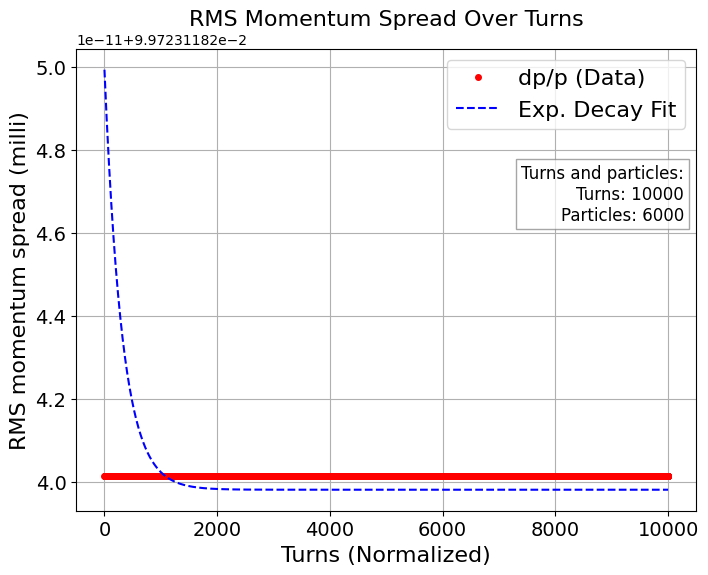

In [3]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Define exponential decay function
def exp_decay(x, A, B, C):
    return A * np.exp(-B * x) + C


fig, ax4 = plt.subplots(figsize=(8, 6))
# Prepare x and y data (ensure they are NumPy arrays)
x_data = pa / total_angle  # Normalized turns (x-axis)
y_data = rms_momentum_spread[2:] * 1000  # Convert to milli (y-axis)

# Provide initial parameter guesses
initial_guess = [y_data[0], 0.001, min(y_data)]  # A = first y value, small decay rate, C = min y value

# Perform the curve fitting
params, covariance = curve_fit(exp_decay, x_data, y_data, p0=initial_guess)

# Generate fitted curve values
x_fit = np.linspace(min(x_data), max(x_data), 500)  # Smooth curve
y_fit = exp_decay(x_fit, *params)

# Plot the data
ax4.plot(x_data, y_data, label='dp/p (Data)', color='red', marker='o', linestyle='None', markersize=4)

# Plot the fitted exponential decay curve
ax4.plot(x_fit, y_fit, label='Exp. Decay Fit', linestyle="--", color="blue")

# Labels and title
ax4.set_xlabel('Turns (Normalized)', fontsize=16)
ax4.set_ylabel('RMS momentum spread (milli)', fontsize=16)
ax4.set_title('RMS Momentum Spread Over Turns', fontsize=16)
ax4.grid(True)
ax4.legend(loc='upper right', fontsize=16)

# Additional text box for parameters
N_text = f"Turns and particles:\nTurns: {Nturns}\nParticles: {Nparts}"
ax4.text(0.98, 0.75, N_text,
         transform=ax4.transAxes,
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

# Adjust tick label size
ax4.tick_params(axis='both', labelsize=14)

# Show fit parameters
A_fit, B_fit, C_fit = params

tau_longitudinal_cooling = 1 / B_fit

tau_L_real = tau_longitudinal_cooling * Trev

print(f"Cooling time (τ) for RMS momentum spread: {tau_L_real:.6f} sec")

plt.show()



RMS Emittance Fit: A = 0.9098, B = 7.8802e-04, C = 0.0135
Geometric Emittance Fit: A = 0.9096, B = 7.8928e-04, C = 0.0141
tau rms: 1269.0055195380892
Cooling time (τ) for RMS emittance: 0.000788 sec
Cooling time (τ) for Geometric emittance: 0.000786 sec


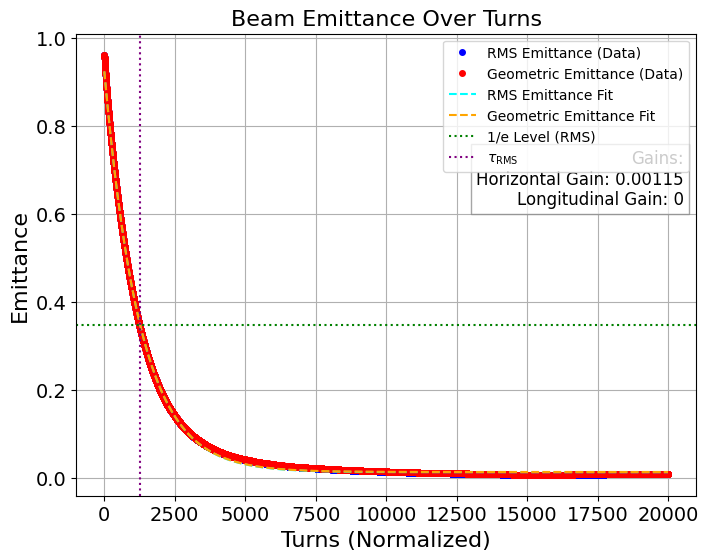

In [37]:
def exp_decay(x, A, B, C):
    return A * np.exp(-B * x) + C

# Prepare x and y data
x_data = pa / total_angle  # Normalized turns (x-axis)
y_data_emittance = emittance[2:]  # RMS Emittance (Blue)
y_data_geo = geo_emittance[2:]  # Geometric Emittance (Red)

# Provide initial parameter guesses
initial_guess_emittance = [y_data_emittance[0], 0.001, min(y_data_emittance)]
initial_guess_geo = [y_data_geo[0], 0.001, min(y_data_geo)]

# Fit the RMS emittance
params_emittance, _ = curve_fit(exp_decay, x_data, y_data_emittance, p0=initial_guess_emittance)
x_fit = np.linspace(min(x_data), max(x_data), 500)
y_fit_emittance = exp_decay(x_fit, *params_emittance)

# Fit the geometric emittance
params_geo, _ = curve_fit(exp_decay, x_data, y_data_geo, p0=initial_guess_geo)
y_fit_geo = exp_decay(x_fit, *params_geo)

# Create figure if needed
fig, ax2 = plt.subplots(figsize=(8, 6))

# Plot the original data
ax2.plot(x_data, y_data_emittance, label='RMS Emittance (Data)', color='blue', marker='o', linestyle='None', markersize=4)
ax2.plot(x_data, y_data_geo, label='Geometric Emittance (Data)', color='red', marker='o', linestyle='None', markersize=4)

# Plot the fitted curves
ax2.plot(x_fit, y_fit_emittance, label='RMS Emittance Fit', linestyle="--", color="cyan")
ax2.plot(x_fit, y_fit_geo, label='Geometric Emittance Fit', linestyle="--", color="orange")

# Labels and title
ax2.set_xlabel('Turns (Normalized)', fontsize=16)
ax2.set_ylabel('Emittance', fontsize=16)
ax2.set_title('Beam Emittance Over Turns', fontsize=16)
ax2.grid(True)
ax2.legend(loc='upper right', fontsize=16)

# Additional text box for gains
gains_text = f"Gains:\nHorizontal Gain: {gain:.5f}\nLongitudinal Gain: {gainL}"
ax2.text(0.98, 0.75, gains_text,
         transform=ax2.transAxes,
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

# Adjust tick label size
ax2.tick_params(axis='both', labelsize=14)

# Print fit parameters
A_rms, B_rms, C_rms = params_emittance
A_geo, B_geo, C_geo = params_geo
print(f"RMS Emittance Fit: A = {A_rms:.4f}, B = {B_rms:.4e}, C = {C_rms:.4f}")
print(f"Geometric Emittance Fit: A = {A_geo:.4f}, B = {B_geo:.4e}, C = {C_geo:.4f}")
tau_rms = 1 / B_rms
tau_geo = 1 / B_geo
print('tau rms:', tau_rms)
tau_rms_real = tau_rms * Trev
tau_geo_real = tau_geo * Trev
print(f"Cooling time (τ) for RMS emittance: {tau_rms_real:.6f} sec")
print(f"Cooling time (τ) for Geometric emittance: {tau_geo_real:.6f} sec")

y_tau_rms = C_rms + (A_rms * np.exp(-1))

# Add horizontal line at that value
ax2.axhline(y_tau_rms, color='green', linestyle=':', label=f'1/e Level (RMS)')

# And optionally vertical line at tau_rms (in normalized turns)
ax2.axvline(tau_rms, color='purple', linestyle=':', label=r'$\tau_{\mathrm{RMS}}$')

ax2.legend()

# Show plot
plt.show()

RMS Emittance Fit (first 3000 turns): A = 0.9068, B = 8.6010e-04, C = 0.0352
Geometric Emittance Fit (first 3000 turns): A = 0.9066, B = 8.6045e-04, C = 0.0354
Tau RMS (normalized turns): 1162.6589
Tau Geometric (normalized turns): 1162.1874
Cooling time (τ) for RMS emittance: 0.000722 sec
Cooling time (τ) for Geometric emittance: 0.000721 sec


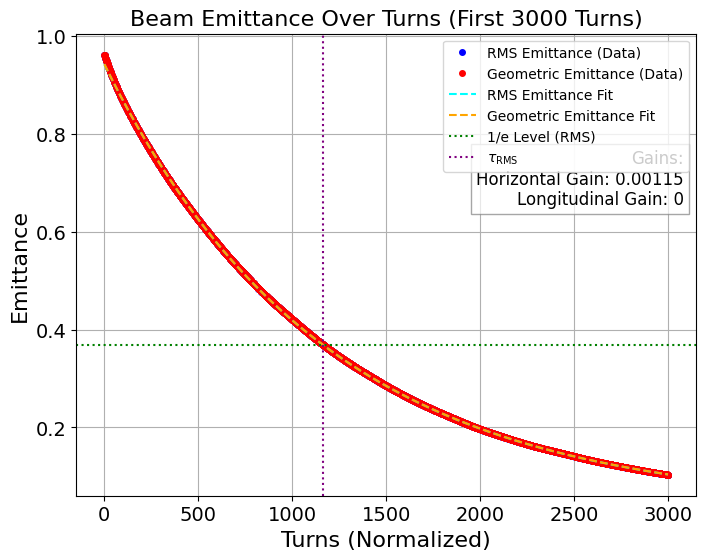

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define exponential decay function
def exp_decay(x, A, B, C):
    return A * np.exp(-B * x) + C

# Prepare x and y data
x_data = pa / total_angle  # Normalized turns (x-axis)
y_data_emittance = emittance[2:]  # RMS Emittance (Blue)
y_data_geo = geo_emittance[2:]  # Geometric Emittance (Red)

# Provide initial parameter guesses
initial_guess_emittance = [y_data_emittance[0], 0.001, min(y_data_emittance)]
initial_guess_geo = [y_data_geo[0], 0.001, min(y_data_geo)]

# Define the limit in number of turns for fitting
turn_limit = 3000

# Find index corresponding to 3000 turns
index_limit = turn_limit  # if one value per turn and x_data is normalized evenly

# Fit the RMS emittance for first 3000 turns
params_emittance, _ = curve_fit(
    exp_decay,
    x_data[:index_limit],
    y_data_emittance[:index_limit],
    p0=initial_guess_emittance
)

# Fit the geometric emittance for first 3000 turns
params_geo, _ = curve_fit(
    exp_decay,
    x_data[:index_limit],
    y_data_geo[:index_limit],
    p0=initial_guess_geo
)

# Prepare fit curves for plotting (from 0 to max of x_data[:index_limit])
x_fit = np.linspace(min(x_data[:index_limit]), max(x_data[:index_limit]), 500)
y_fit_emittance = exp_decay(x_fit, *params_emittance)
y_fit_geo = exp_decay(x_fit, *params_geo)

# Create figure
fig, ax2 = plt.subplots(figsize=(8, 6))

# Plot the original data (up to 3000 turns)
ax2.plot(x_data[:index_limit], y_data_emittance[:index_limit], label='RMS Emittance (Data)', color='blue', marker='o', linestyle='None', markersize=4)
ax2.plot(x_data[:index_limit], y_data_geo[:index_limit], label='Geometric Emittance (Data)', color='red', marker='o', linestyle='None', markersize=4)

# Plot the fitted curves
ax2.plot(x_fit, y_fit_emittance, label='RMS Emittance Fit', linestyle="--", color="cyan")
ax2.plot(x_fit, y_fit_geo, label='Geometric Emittance Fit', linestyle="--", color="orange")

# Labels and title
ax2.set_xlabel('Turns (Normalized)', fontsize=16)
ax2.set_ylabel('Emittance', fontsize=16)
ax2.set_title('Beam Emittance Over Turns (First 3000 Turns)', fontsize=16)
ax2.grid(True)
ax2.legend(loc='upper right', fontsize=16)

# Additional text box for gains
gains_text = f"Gains:\nHorizontal Gain: {gain:.5f}\nLongitudinal Gain: {gainL}"
ax2.text(0.98, 0.75, gains_text,
         transform=ax2.transAxes,
         fontsize=12,
         verticalalignment='top',
         horizontalalignment='right',
         bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

# Adjust tick label size
ax2.tick_params(axis='both', labelsize=14)

# Print fit parameters
A_rms, B_rms, C_rms = params_emittance
A_geo, B_geo, C_geo = params_geo
print(f"RMS Emittance Fit (first {turn_limit} turns): A = {A_rms:.4f}, B = {B_rms:.4e}, C = {C_rms:.4f}")
print(f"Geometric Emittance Fit (first {turn_limit} turns): A = {A_geo:.4f}, B = {B_geo:.4e}, C = {C_geo:.4f}")

# Compute tau values
tau_rms = 1 / B_rms
tau_geo = 1 / B_geo
print(f'Tau RMS (normalized turns): {tau_rms:.4f}')
print(f'Tau Geometric (normalized turns): {tau_geo:.4f}')

# Convert to seconds
tau_rms_real = tau_rms * Trev
tau_geo_real = tau_geo * Trev
print(f"Cooling time (τ) for RMS emittance: {tau_rms_real:.6f} sec")
print(f"Cooling time (τ) for Geometric emittance: {tau_geo_real:.6f} sec")

# Add horizontal line at 1/e level for RMS
y_tau_rms = C_rms + (A_rms * np.exp(-1))
ax2.axhline(y_tau_rms, color='green', linestyle=':', label=f'1/e Level (RMS)')

# Add vertical line at tau_rms (in normalized turns)
ax2.axvline(tau_rms, color='purple', linestyle=':', label=r'$\tau_{\mathrm{RMS}}$')

# Finalize legend
ax2.legend()

# Show plot
plt.show()



In [42]:
import numpy as np
import math
import matplotlib.pyplot as plt
import time
import scipy as sp
import seaborn as sns
import pandas as pd



Nparts, Nturns =  3000, 20000 
betPU, alfPU       =  1.3, -0.9
betK, alfK         =  0.8,  0.6
gamPU, gamK        =  (1 + alfPU**2)/betPU, (1 + alfK**2)/betK
muPUK, muKPU       =  1.51, 2*np.pi*1.34 - 1.51
total_angle        =  2*np.pi*1.34
etaPUK, etaKPU     =  -0.01, -0.01     #eta PUK must be reletevely small, so they dont change slices so fast... 0.02 breaks the system ... It is the limit case!!!! very sensitive on etaPUK --> 2 much unwanted mixing, also etaKPU cant go very low(limit case 0.3) because then the mixing is bad
sigdelt            = .0001            # rms momentum spread in unit
Th, Trev           =  (620.6e-9)/2, 620.6e-9# half width of simulation window and revolution period in s
Tovlap, NSamp, add = 4*sigdelt*abs(etaPUK + etaKPU)*Trev, 800, '2000'
    #gain               =  0.00018  #as long as I reduce the eta, i have to reduce gains as well... see book
    #gainL              =  3e-8
over_sample_factor=10
DTSamp   = Th/NSamp
NSampext = math.ceil( Tovlap/DTSamp )
inds = np.arange( (-NSampext)*over_sample_factor , (NSamp+1+NSampext + 1)*over_sample_factor )
t_bins = inds*DTSamp/over_sample_factor -Th/2
wlL, wrL = -1.6e-9, 1.6e-9
wlH, wrH = -1.6e-9, 1.6e-9
gainL=0
rng = np.random.default_rng(2275405 )

#time delay cooling here!~!!!!!1
#this approach -> bin centers main = only bin centers main
#also cut the time offset ->Th+Dtsamp+Tovlap

#datin  = time.time()  # record start time - to estimate run duration at end

def running_average(x, y, bins):
     """
     Compute the running average of y over fixed intervals in x efficiently using NumPy.

    Parameters:
    x (array-like): Array of x-values (sorted or unsorted).
    y (array-like): Array of y-values corresponding to x.
    interval_width (float): The width of the intervals.

    Returns:
    bin_centers (numpy.ndarray): The centers of the bins.
    averages (numpy.ndarray): The average y-values for each bin.
     """
    # Ensure inputs are NumPy arrays
     x = np.array(x)
     y = np.array(y)

    # Bin the data using NumPy digitize
     bin_indices = np.digitize(x, bins) - 1  # Get zero-based bin indices

    # keep only elements within bins
     valid_input_indices = (bin_indices > 0) & (bin_indices < len(bins) - 1)

    # Preallocate array for averages
     averages = np.zeros(len(bins) - 1, dtype=float)
    
    # Use NumPy's bincount for fast bin-based summation and counts
     bin_sums   = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1, weights=y[valid_input_indices])
     bin_counts = np.bincount(bin_indices[valid_input_indices], minlength=len(bins) - 1)
    
    # Avoid division by zero: compute averages where bin_counts > 0
     non_empty_bins = bin_counts > 0
     averages[non_empty_bins] = bin_sums[non_empty_bins] / bin_counts[non_empty_bins]

    # Compute bin centers
     bin_centers = (bins[:-1] + bins[1:]) / 2

     return bin_centers, averages, bin_counts, bin_sums


    

# Routine to do do the exchange of .. ended up by regrouping from scratch 
def PartsExchange( ptsEarly, ptsLate,Th ):
     ptsEarlyNew, ptsLateNew = [], []
     for x, xp, delt, Tau in ptsEarly:
        if Tau < Th/2:  # should remain in "early group
            ptsEarlyNew += [ [x, xp, delt, Tau] ]
        else:
            ptsLateNew += [ [x, xp, delt, Tau - Th] ]
     for x, xp, delt, Tau in ptsLate:
        if Tau > -Th/2:
            ptsLateNew += [ [x, xp, delt, Tau] ]
        else:
            ptsEarlyNew += [ [x, xp, delt, Tau + Th] ]
     return ptsEarlyNew, ptsLateNew


def respH( Dt ):
   # if Dt < 1.*wlH or Dt > 1.*wrH:
    #    print( f' ===> function respH called with Dt ={1e6*Dt:8.4f}' )
      return (1 - 27e18*Dt**2)*(1 - 3.e18*Dt**2)*(1 - 1.15e18*Dt**2)*(1 - (.625e9*Dt)**2)**7
#   return (1 - 23e16*Dt**2)*(1 - 3.e16*Dt**2)*(1 - 1.15e16*Dt**2)*(1 - (.625e8*Dt)**2)**7
#   return (1 - 25e-12*Dt^2)*(1 - 3e-12*Dt^2)*(1 - 1.15e-12*Dt^2)*(1 - (Dt/1.5)^2)^6


def respL( Dt ):
   # if Dt < 1.*wlL or Dt > 1.*wrL:
    #    print( f' ===> function respL called with Dt ={1e6*Dt:8.4f}' )
      return  (63e9*Dt)*(1 - 6.5e18*Dt**2)*(1 - 1.55e18*Dt**2)*(1 - (.625e9*Dt)**2)**8

def TimeTraces(ptsEarly, ptsMain, ptsLate, bins,Th):
     """
    Generate time traces without applying the `Th / 2` offset internally.
     """
    
     ptsEarly = np.array(ptsEarly)
     ptsMain = np.array(ptsMain)
     ptsLate = np.array(ptsLate)
     # Compute histograms of beam distribution
     bin_centers_early, averages_early, count_early, sum_early = running_average(
        ptsEarly[:, 3]-Th, ptsEarly[:, 0], bins
      )
     bin_centers_main, averages_main, count_main, sum_main = running_average(
        ptsMain[:, 3], ptsMain[:, 0], bins
      )
     bin_centers_late, averages_late, count_late, sum_late = running_average(
        ptsLate[:, 3]+Th, ptsLate[:, 0], bins
      )

    # Compute time traces
     TraceH_early = np.convolve(respH_new_once, sum_early, 'same')
     TraceH_main = np.convolve(respH_new_once, sum_main, 'same')
     TraceH_late = np.convolve(respH_new_once, sum_late, 'same')
    
     TraceL_early = np.convolve(respL_new_once, count_early, 'same')
     TraceL_main = np.convolve(respL_new_once, count_main, 'same')
     TraceL_late = np.convolve(respL_new_once, count_late, 'same')

     TraceH = TraceH_early + TraceH_main + TraceH_late
     TraceL = TraceL_early + TraceL_main + TraceL_late #i am multiplying with this factor in order to amplify the signal!!!!!
    
    
    
     return bin_centers_main, TraceH, TraceL
def kickH(pts, signalH):
      corrected_pts = []
      for x, xp, delt, Tau in pts:
        # Interpolate signalH at the particle's Tau
        signal_value = signalH(Tau)
        # Correct xp using the signal value (define your correction logic)
        corrected_xp = xp +gain * signal_value  # I add the signal!!!!!
        # Append the updated particle to the new list
        corrected_pts.append([x, corrected_xp, delt, Tau])
      return corrected_pts

def kickL(pts, signalL):
     corrected_pts = []
     for x, xp, delt, Tau in pts:
        # Interpolate signalL at the particle's Tau
        signal_value = signalL(Tau)
        # Correct xp using the signal value (define your correction logic)
        corrected_delt = delt + gainL * signal_value  # Example: subtracting scaled signal
        # Append the upd1.0pend([x, xp, corrected_delt, Tau])
        corrected_pts.append([x, xp, corrected_delt, Tau])
     return corrected_pts

respH_new_once = respH(np.arange(wlH, wrH, DTSamp/over_sample_factor ))
respL_new_once = respL(np.arange(wlL, wrL, DTSamp/over_sample_factor ))

def Cooling(gain,gainL):
    
  



   
# definition of the transverse "response function", which is given by the 
#    routine resp for the interval -wlH < Dt < wrH and 0 outside
    
#rng = np.random.default_rng(18022005)
    #rng = np.random.default_rng(2275405 )   #this gives us the random seed!!!!

# Total width (particles of both colors) of beam time window is 2*Th ('h' for half)
#  for sampling each sub-window (red or blue) divided into NSamp intervals. This
#  means samp,ing rate DTsamp and NSamp + 1 points. On both ends to be added 
#  ceiling( Tovlap/DTSamp ) points   
    

    print('========>', NSamp, NSampext, DTSamp, Th, (wrH - wlH)/DTSamp)

    
# Routine to generate time traces

   

   

  
# Computation of transverse transfer matrix elements
    projPU11 =  betPU**(1/2)
    projPU21 = -alfPU/betPU**(1/2)
    projPU22 =  1/betPU**(1/2)

    matPUK11 = ((betK/betPU)**(1/2))*(np.cos(muPUK) + alfPU*np.sin(muPUK))
    matPUK12 = ((betPU*betK)**(1/2))*np.sin(muPUK)
    matPUK21 = ((alfPU-alfK)*np.cos(muPUK) - (1+alfPU*alfK)*np.sin(muPUK))/((betPU*betK)**(1/2))
    matPUK22 = ((betPU/betK)**(1/2))*(np.cos(muPUK) - alfK*np.sin(muPUK))

    matKPU11 = ((betPU/betK)**(1/2))*(np.cos(muKPU) + alfK*np.sin(muKPU))
    matKPU12 = ((betPU*betK)**(1/2))*np.sin(muKPU)
    matKPU21 = ((alfK-alfPU)*np.cos(muKPU) - (1+alfPU*alfK)*np.sin(muKPU))/((betPU*betK)**(1/2))
    matKPU22 = ((betK/betPU)**(1/2))*(np.cos(muKPU) - alfPU*np.sin(muKPU))

# Generate macroparticles in two groups with red ones and blue ones
#    .. say we start with red particles the early ones
    ptsRed  = []
    ptsBlue = []
    for _ in range(Nparts):
      Tau = rng.uniform(-Th, Th)
      xn, xpn, deltn = rng.normal(0., 1.), rng.normal(0., 1.), rng.normal(0., 1.)
      if Tau < 0: 
        ptsRed += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                     deltn*sigdelt, Tau + Th/2] ]
      else:
        ptsBlue += [ [projPU11*xn, projPU21*xn + projPU22*xpn, 
                      deltn*sigdelt, Tau - Th/2] ]


    emittance=np.zeros(Nturns+2)
    geo_emittance=np.zeros(Nturns+2)
    rms_momentum_spread=np.zeros(Nturns+2)
    beam=[]
    xp_beam=[]
    x_beam=[]
    beam=ptsRed+ptsBlue
    beam = np.array(beam)
    x_beam=beam[:,0]
    xp_beam=beam[:,1]
    x_initial=x_beam
    xp_initial=xp_beam
    tau_initial=beam[:,3]
    delt_initial=beam[:,2]
    counts_initial, bins_initial = np.histogram(delt_initial, bins=30)
    emittance[0]=np.sqrt(np.mean(x_initial**2)*np.mean(xp_initial**2)-np.mean(x_initial*xp_initial)**2)   
    geo_emittance[0]=((gamPU*np.mean(x_initial**2)+2*alfPU*np.mean(x_initial*xp_initial)+betPU*np.mean(xp_initial**2)))/2
#emittance_individual_particles[0][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
    rms_momentum_spread[0]=np.sqrt(np.mean(delt_initial**2)-np.mean(delt_initial)**2)



    ptsRedprev = ptsRed
    ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
               Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
    ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
               Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]

# Prepare for tracking of blue particles and track them once around
    ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed,Th )
    ptsBlueprev = ptsBlue
    time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins,Th )

    ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]  # no action at kicker
#ptsBlue=kickH(ptsBlue,cs)
    ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsBlue]
    TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
# Prepare for 2nd tracking of red particles and track them once around
    ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue,Th )
    ptsRedprev = ptsRed
    time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins,Th )
#cs = sp.interpolate.CubicSpline( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
 #                 TrHRed[-NSampext:] + TrHRed[:NSamp + 1 + NSampext] )
    ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
            Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]  # no action at kicker
#ptsRed=kickH(ptsRed,cs)
    ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
            Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed]
    TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
# Now the blue ones are early - now just enter loop over number of turns
#   later - for longitudinal filter cooling - some more tracking will be needed

    beam=[]
    xp_beam=[]
    x_beam=[]
    beam=ptsRed+ptsBlue
    beam = np.array(beam)
    x_beam=beam[:,0]
    xp_beam=beam[:,1]
    dtl_beam=beam[:,2]
    emittance[1]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2) 
#emittance_individual_particles[1][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2
    rms_momentum_spread[1]=np.sqrt(np.mean(dtl_beam**2)-np.mean(dtl_beam)**2)

# Now we can go in loop and even implement transverse cooling or longitudinal time delay cooling (but not filter)
    for turn in range(Nturns):
    #print(f' turn {turn:5d} after {(time.time() - datin):8.2f} s <===')
#   Get ready for the blue particles to be tracked and track them to kicker
     ptsBlue, ptsRed = PartsExchange( ptsBlue, ptsRed,Th )
     ptsBlueprev, TrLBlueprev = ptsBlue, TrLBlue  # Keep longitudinal trace to add filter cooling later
     time2,TrHBlue, TrLBlue = TimeTraces( ptsRedprev, ptsBlue, ptsRed,t_bins,Th )
     TrLDiffBlue = [h - l for h, l in zip(TrLBlue_prev, TrLBlue)]
     cs = sp.interpolate.CubicSpline( time2, 
                  TrHBlue )
     csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffBlue) )
    #cs = sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrHBlue[-NSampext:] + TrHBlue[:NSamp + 1 + NSampext] )
    #csL=sp.interpolate.interp1d( DTSamp*np.arange(-NSampext, NSamp + 1 + NSampext)-Th/2, 
     #             TrLBlue[-NSampext:] + TrLBlue[:NSamp + 1 + NSampext] )

    #print(len(TrHBlue))
     ptsBlue = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                 Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsBlue ]
#   One day cooling to be applied -  now just dump time traces instead
     ptsBlue=kickH(ptsBlue,cs)
     ptsBlue=kickL(ptsBlue,csL)
#   track the blue one further to the PU
     ptsBlue = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
                 Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsBlue ]
     TrHBlue_prev, TrLBlue_prev = TrHBlue, TrLBlue
#   Get ready for the red particles to be tracked and track them to kicker
     ptsRed, ptsBlue = PartsExchange( ptsRed, ptsBlue,Th )
     ptsRedprev, TrLRedprev = ptsRed, TrLRed  # Keep longitudinal trace to add filter cooling later
     time2,TrHRed, TrLRed = TimeTraces( ptsBlueprev, ptsRed, ptsBlue,t_bins,Th )
     TrLDiffRed = [h - l for h, l in zip(TrLRed_prev, TrLRed)]
     cs = sp.interpolate.CubicSpline( time2, 
                  TrHRed )
     csL=sp.interpolate.CubicSpline( time2, 
                  np.array(TrLDiffRed) )
    
     y_cs = cs(time2)
     y_csL = csL(time2)
    #print("Spline Knots:", cs.x)  # Knots where the spline pieces join
    #print("Spline Coefficients:", cs.c)  # Coefficients of the spline pieces
   
     tauPU=[]
     xPU=[]
     beam=ptsRed
     beam = np.array(beam)
     tauPU=beam[:,3]
     xPU=beam[:,0]
    
    
# Plot the spline
     '''
     if turn==Nturns-1:
      plt.figure(figsize=(8, 5))
      plt.plot(time2, y_cs, label="TrHRed Interpolated", linestyle="-")
     #plt.plot(t_smooth, y_csL, label="TrLDiffRed Interpolated", linestyle="--")
      plt.scatter(time2, TrHRed, marker="o", color="blue", label="horizontal signal")
      plt.scatter(tauPU, xPU, zorder=5, color="red", label="position of particles")
     '''
     
     ptsRed = [ [matPUK11*x + matPUK12*xp, matPUK21*x + matPUK22*xp, delt, 
                Tau + etaPUK*delt*Trev] for x, xp, delt, Tau in ptsRed ]
#   One day cooling(s) to be applied - now just dump time traces instead
     ptsRed=kickH(ptsRed,cs)
     ptsRed=kickL(ptsRed,csL)   #time of flight method longitudinal cooling
#   track the red ones further to the PU, where they will be the late ones
     ptsRed = [ [matKPU11*x + matKPU12*xp, matKPU21*x + matKPU22*xp, delt, 
                Tau + etaKPU*delt*Trev] for x, xp, delt, Tau in ptsRed ] 
     TrHRed_prev, TrLRed_prev = TrHRed, TrLRed
     beam=[]
     xp_beam=[]
     x_beam=[]
     delta_beam=[]
     dlt_final=[]
     tau_final=[]
     beam=ptsRed+ptsBlue
     beam = np.array(beam)
     x_beam=beam[:,0]
     xp_beam=beam[:,1]
     delta_beam=beam[:,2]
     tau_final=beam[:,3]
     dlt_final=beam[:,2]
     counts_final, bins_final = np.histogram(dlt_final, bins=30)
     emittance[turn+2]=np.sqrt(np.mean(x_beam**2)*np.mean(xp_beam**2)-np.mean(x_beam*xp_beam)**2)
     geo_emittance[turn+2]=(gamPU*np.mean(x_beam**2)+2*alfPU*np.mean(x_beam*xp_beam)+betPU*np.mean(xp_beam**2))/2
     rms_momentum_spread[turn+2]=np.sqrt(np.mean(delta_beam**2)-np.mean(delta_beam)**2)
    #emittance_individual_particles[turn+2][:]=(gamPU*x_beam[:10]**2+2*alfPU*(x_beam[:10]*xp_beam[:10])+betPU*(xp_beam[:10]**2))/2

    print(f'The initial emittance is {emittance[0]}{chr(0x03C0)} mm*mrad')
    print(f'The final emittance after cooling is {emittance[-1]}{chr(0x03C0)} mm*mrad')
    print(f'Is emittance reduced? -->  {emittance[-1] < emittance[0]}')
    if emittance[-1] < emittance[0]:
      print(f"Emittance is reduced by {(emittance[0] - emittance[-1]) * 100 / emittance[0]}%")
    print(f'The initial rms_momentum_spread is {rms_momentum_spread[0]} ')
    print(f'The final rms_momentum_spread after cooling is {rms_momentum_spread[-1]} ')
    print(f'Is rms_momentum_spread reduced? -->  {rms_momentum_spread[-1] < rms_momentum_spread[0]}')
    if rms_momentum_spread[-1] < rms_momentum_spread[0]:
      print(f"rms_momentum_spread is reduced by {(rms_momentum_spread[0] - rms_momentum_spread[-1]) * 100 / rms_momentum_spread[0]}%")

    return emittance[-1]   #, rms_momentum_spread[-1]



In [43]:
gain_values = np.linspace(0.0002, 0.0012, 10)  # Example range
#gainL_values = np.linspace(2e-8, 6e-7, 10)

best_emittance = float('inf')
#best_rms_spread = float('inf')
best_params = None

results = np.zeros(len(gain_values))    #, len(gainL_values), 2))  # Stores emittance and rms spread

for i,gain in enumerate(gain_values):
    #for j,gainL in enumerate(gainL_values):
        # Run your simulation with (gain, gainL)

        rng = np.random.default_rng(2275405 )
        final_emittance = Cooling(gain,0)  # Replace with actual function
        
        results[i] = final_emittance
        #results[i, j, 1] = final_rms_spread

        # Check if this is the best result so far
        if final_emittance < best_emittance: #and final_rms_spread < best_rms_spread:
            best_emittance = final_emittance
            #best_rms_spread = final_rms_spread
            best_params = gain

print(f"Optimal parameters: gain={best_params}")

========> 800 1 3.87875e-10 3.103e-07 8.25008056719304
The initial emittance is 0.9785205504150565π mm*mrad
The final emittance after cooling is 0.026117197275148905π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 97.33095055959011%
The initial rms_momentum_spread is 9.920147303663395e-05 
The final rms_momentum_spread after cooling is 9.920147303663395e-05 
Is rms_momentum_spread reduced? -->  False
========> 800 1 3.87875e-10 3.103e-07 8.25008056719304
The initial emittance is 0.9785205504150565π mm*mrad
The final emittance after cooling is 0.007123907839239202π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 99.27197156603226%
The initial rms_momentum_spread is 9.920147303663395e-05 
The final rms_momentum_spread after cooling is 9.920147303663395e-05 
Is rms_momentum_spread reduced? -->  False
========> 800 1 3.87875e-10 3.103e-07 8.25008056719304
The initial emittance is 0.9785205504150565π mm*mrad
The final emittance after cooling is 0.00358999096

========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.35050327486967264π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 63.41828237039628%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 3.0982823070084354e-05 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 68.41106480779038%
========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.380017189100154π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 60.33794117550939%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 1.1058377103954056e-05 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 88.72528959424908%
========> 800 1 1.2499999999999998e-10

/tmp/vtsianti/ipykernel_3226476/1887543318.py:344: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 5))


The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.05360334804354013π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 94.40546584661934%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 3.0982823070084354e-05 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 68.41106480779038%
========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.09300499085705846π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 90.29315114119302%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 1.1058377103954056e-05 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 88.72528959424908%
========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.958137828

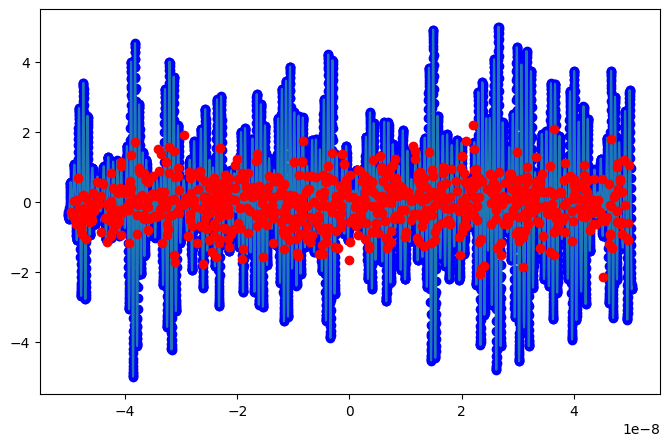

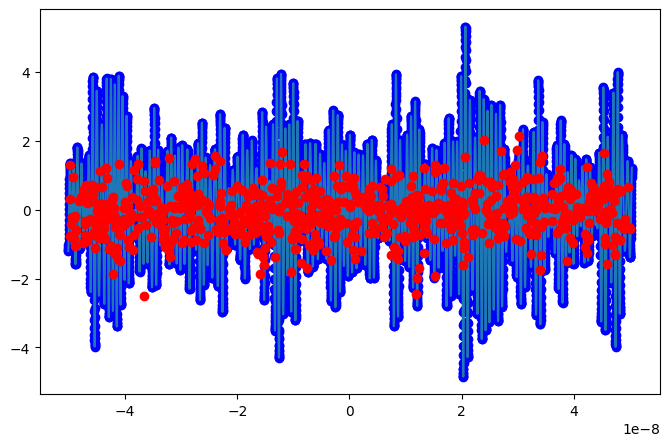

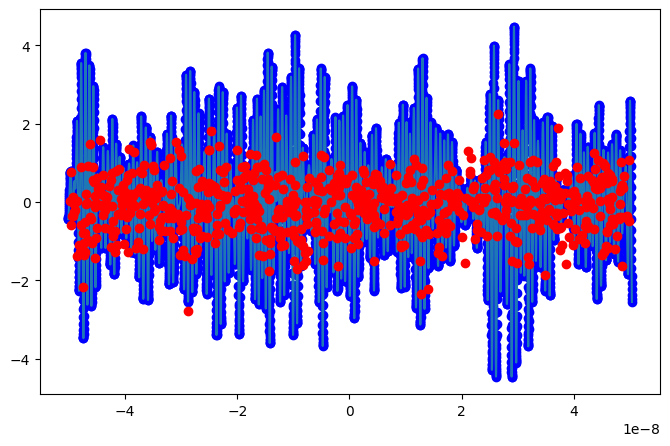

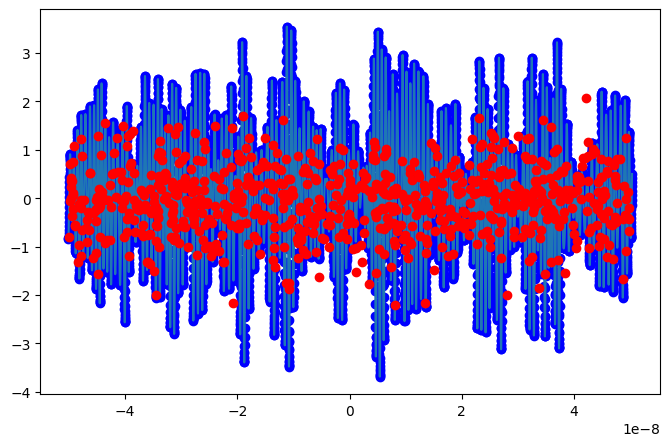

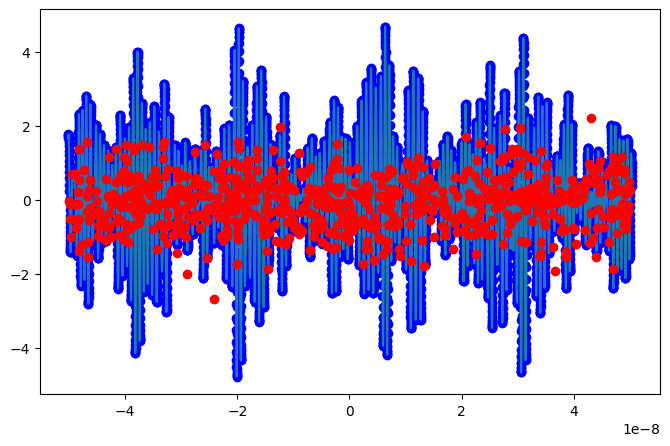

...

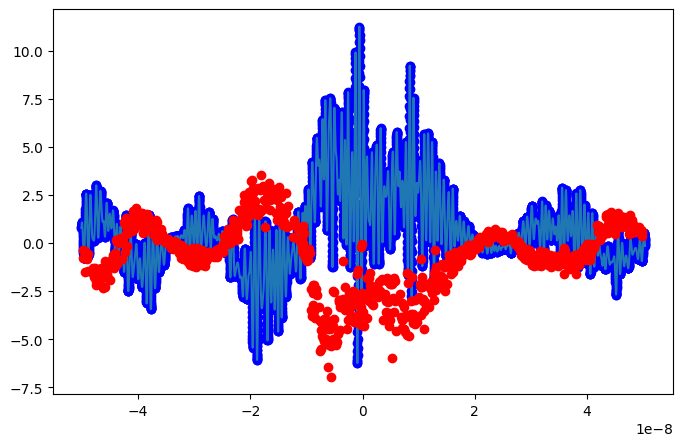

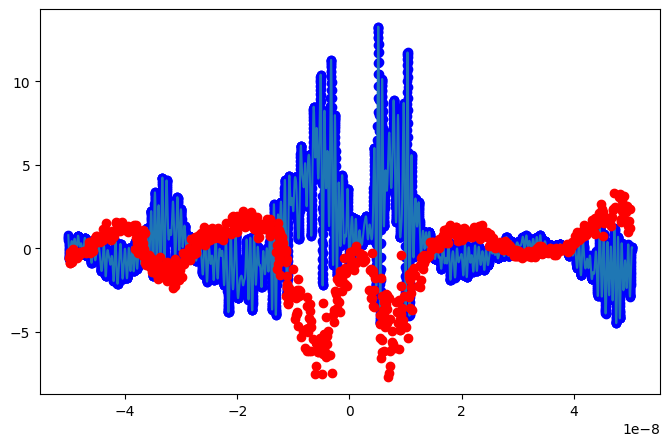

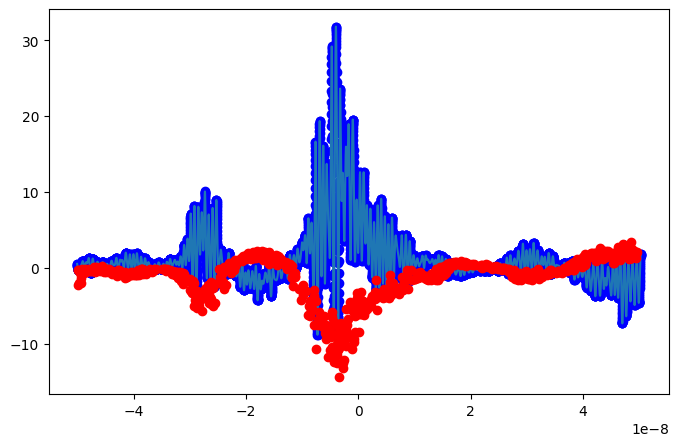

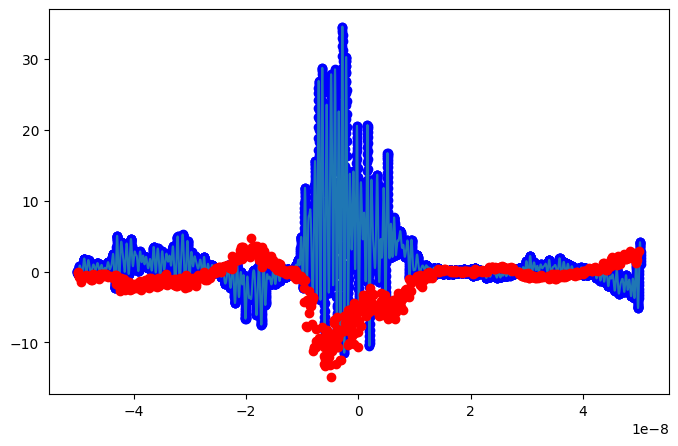

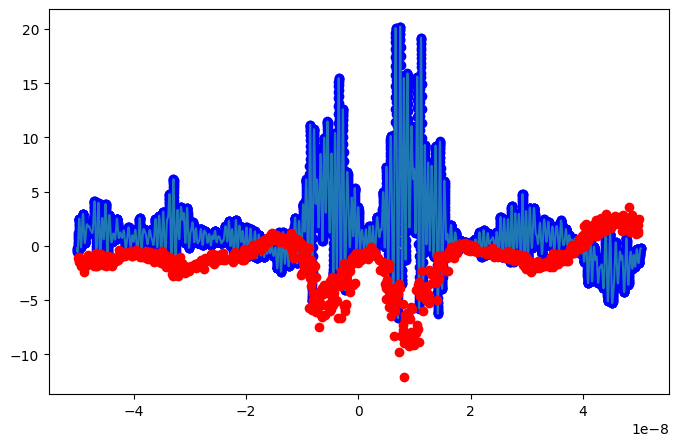

In [134]:


gain_values = np.linspace(0.0001, 0.001, 10)  # Example range
gainL_values = np.linspace(2e-8, 6e-7, 10)

best_emittance = float('inf')
best_rms_spread = float('inf')
best_params = None

results = np.zeros((len(gain_values), len(gainL_values), 2))  # Stores emittance and rms spread

for i,gain in enumerate(gain_values):
    for j,gainL in enumerate(gainL_values):
        # Run your simulation with (gain, gainL)

        rng = np.random.default_rng(2275405 )
        final_emittance, final_rms_spread = Cooling(gain, gainL)  # Replace with actual function
        
        results[i, j, 0] = final_emittance
        results[i, j, 1] = final_rms_spread

        # Check if this is the best result so far
        if final_emittance < best_emittance and final_rms_spread < best_rms_spread:
            best_emittance = final_emittance
            best_rms_spread = final_rms_spread
            best_params = (gain, gainL)

print(f"Optimal parameters: gain={best_params[0]}, gainL={best_params[1]}")

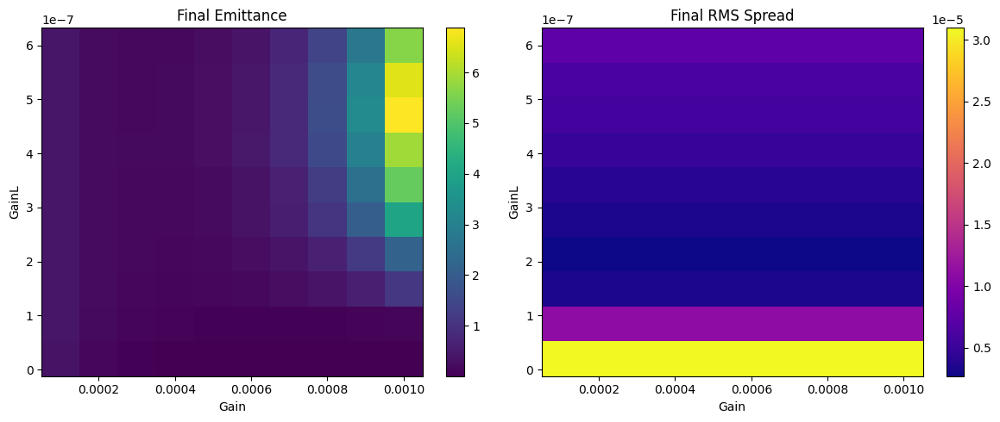

In [135]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming gain_values and gainL_values are already defined
gain_values = np.linspace(0.0001, 0.001, 10)
gainL_values = np.linspace(2e-8, 6e-7, 10)

# Create the colormaps
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot final emittance
c1 = axes[0].pcolormesh(gain_values, gainL_values, results[:, :, 0].T, shading='auto', cmap='viridis')
fig.colorbar(c1, ax=axes[0])
axes[0].set_title("Final Emittance")
axes[0].set_xlabel("Gain")
axes[0].set_ylabel("GainL")

# Plot final RMS spread
c2 = axes[1].pcolormesh(gain_values, gainL_values, results[:, :, 1].T, shading='auto', cmap='plasma')
fig.colorbar(c2, ax=axes[1])
axes[1].set_title("Final RMS Spread")
axes[1].set_xlabel("Gain")
axes[1].set_ylabel("GainL")

plt.tight_layout()
plt.show()

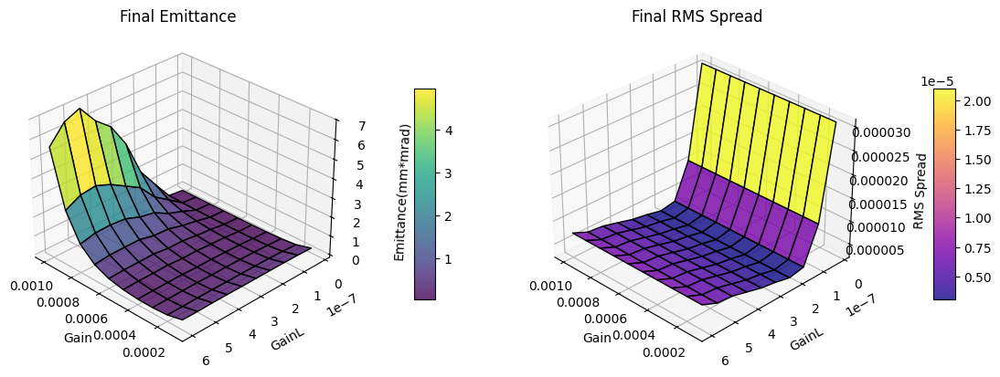

In [ ]:
#1500 particles 10000 turns

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming gain_values and gainL_values are already defined
gain_values = np.linspace(0.0001, 0.001, 10)
gainL_values = np.linspace(2e-8, 6e-7, 10)

# Create a meshgrid for plotting
G, G_L = np.meshgrid(gain_values, gainL_values)

# Extract emittance and rms spread from results
final_emittance = results[:, :, 0].T  # Transpose for correct alignment
final_rms_spread = results[:, :, 1].T

fig = plt.figure(figsize=(14, 6))  # Increased figure size

# --- First subplot: Final Emittance ---
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(G, G_L, final_emittance, cmap='viridis', edgecolor='k', alpha=0.8)
cbar1 = fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=10, pad=0.15)  # Adjust pad
ax1.set_title("Final Emittance")
ax1.set_xlabel("Gain")
ax1.set_ylabel("GainL")
ax1.set_zlabel("Emittance(mm*mrad)", labelpad=10)  # Moves the label away from the color bar

# --- Second subplot: Final RMS Spread ---
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(G, G_L, final_rms_spread, cmap='plasma', edgecolor='k', alpha=0.8)
cbar2 = fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=10, pad=0.15)  # Adjust pad
ax2.set_title("Final RMS Spread")
ax2.set_xlabel("Gain")
ax2.set_ylabel("GainL")
ax2.set_zlabel("RMS Spread", labelpad=10)  # Moves the label away from the color bar
ax2.ticklabel_format(style='plain', axis='z')

ax2.zaxis.offsetText.set_x(2.5) 
# --- Rotate the RMS Spread plot ---
ax1.view_init(elev=30, azim=135)
ax2.view_init(elev=30, azim=135)  # Adjust rotation angles

fig.subplots_adjust(wspace=0.1)  # Add horizontal space between subplots

plt.show()

In [ ]:
#1500 particles 10000 turns

best_emittance = float('inf')
best_rms_spread = float('inf')
best_emittance_params = None
best_rms_spread_params = None

# Loop through the results array
for i in range(len(gain_values)):
    for j in range(len(gainL_values)):
        final_emittance = results[i, j, 0]
        final_rms_spread = results[i, j, 1]
        
        # Check if this is the best emittance so far
        if final_emittance < best_emittance:
            best_emittance = final_emittance
            best_emittance_params = (gain_values[i], gainL_values[j])

        # Check if this is the best RMS spread so far
        if final_rms_spread < best_rms_spread:
            best_rms_spread = final_rms_spread
            best_rms_spread_params = (gain_values[i], gainL_values[j])

# Print the results for minimum emittance and minimum RMS spread
print(f"Best parameters for minimum final emittance: gain={best_emittance_params[0]}, gainL={best_emittance_params[1]}")
print(f"Minimum final emittance: {best_emittance}")

print(f"Best parameters for minimum RMS spread: gain={best_rms_spread_params[0]}, gainL={best_rms_spread_params[1]}")
print(f"Minimum RMS spread: {best_rms_spread}")

Best parameters for minimum final emittance: gain=0.001, gainL=2e-08
Minimum final emittance: 0.0033034729364630217
Best parameters for minimum RMS spread: gain=0.0001, gainL=2.133333333333333e-07
Minimum RMS spread: 2.695248394067019e-06


In [ ]:
#1500 particles 10000 turns

best_emittance = float('inf')
best_rms_spread = float('inf')
best_comb = float('inf')
best_emittance_params = None
best_rms_spread_params = None

# Loop through the results array
for i in range(len(gain_values)):
    for j in range(len(gainL_values)):
        final_emittance = results[i, j, 0]*1e-6
        final_rms_spread = results[i, j, 1]
        
        # Check if this is the best emittance so far
        if final_emittance + final_rms_spread< best_comb:
            best_emittance = final_emittance +final_rms_spread
            best_rms_spread = final_rms_spread
            best_comb = final_emittance +final_rms_spread
            best_emittance_params = (gain_values[i], gainL_values[j])

        

# Print the results for minimum emittance and minimum RMS spread
print(f"Best parameters for emittance and rms spread: gain={best_emittance_params[0]}, gainL={best_emittance_params[1]}")
print(f"Minimum final emittance: {best_emittance}")
print(f"Minimum final rms spread: {best_rms_spread}")



Best parameters for emittance and rms spread: gain=0.00039999999999999996, gainL=2.133333333333333e-07
Minimum final emittance: 2.8284029985588172e-06
Minimum final rms spread: 2.695248394067019e-06


In [173]:
gain_values = np.linspace(0.00005, 0.0008, 10)  # Example range
gainL_values = np.linspace(2e-8, 6e-7, 10)

best_emittance = float('inf')
best_rms_spread = float('inf')
best_params = None

results = np.zeros((len(gain_values), len(gainL_values), 2))  # Stores emittance and rms spread

for i,gain in enumerate(gain_values):
    for j,gainL in enumerate(gainL_values):
        # Run your simulation with (gain, gainL)

        rng = np.random.default_rng(2275405 )
        final_emittance, final_rms_spread = Cooling(gain, gainL)  # Replace with actual function
        
        results[i, j, 0] = final_emittance
        results[i, j, 1] = final_rms_spread

        # Check if this is the best result so far
        if final_emittance < best_emittance and final_rms_spread < best_rms_spread:
            best_emittance = final_emittance
            best_rms_spread = final_rms_spread
            best_params = (gain, gainL)

print(f"Optimal parameters: gain={best_params[0]}, gainL={best_params[1]}")

========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.351190666364508π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 63.34653992640795%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 1.4585824915101e-05 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 85.128834873252%
========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 0.9581378283507063π mm*mrad
The final emittance after cooling is 0.39006211557423465π mm*mrad
Is emittance reduced? -->  True
Emittance is reduced by 59.28956105974134%
The initial rms_momentum_spread is 9.808125181036572e-05 
The final rms_momentum_spread after cooling is 5.967349403014728e-06 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 93.91591227388467%
========> 800 1 1.2499999999999998e-10 1e-07

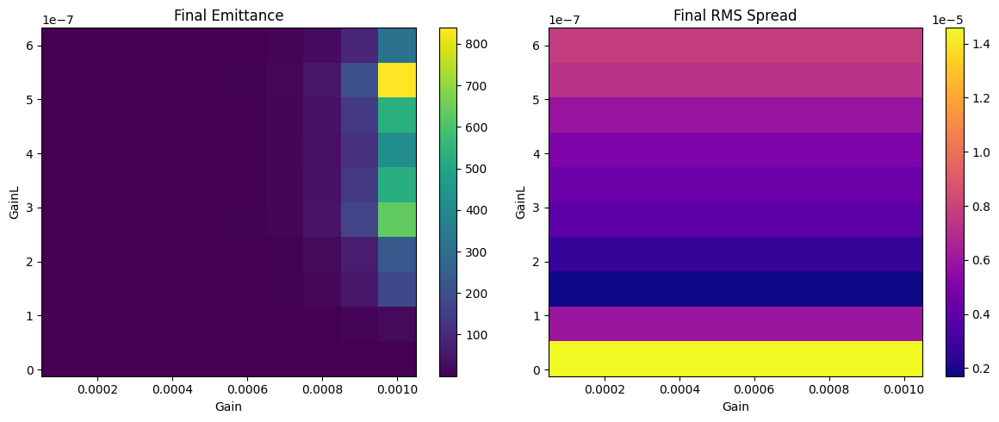

In [ ]:

#1500 particles 20000 turns
import numpy as np
import matplotlib.pyplot as plt

# Assuming gain_values and gainL_values are already defined
gain_values = np.linspace(0.0001, 0.001, 10)
gainL_values = np.linspace(2e-8, 6e-7, 10)

# Create the colormaps
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot final emittance
c1 = axes[0].pcolormesh(gain_values, gainL_values, results[:, :, 0].T, shading='auto', cmap='viridis')
fig.colorbar(c1, ax=axes[0])
axes[0].set_title("Final Emittance")
axes[0].set_xlabel("Gain")
axes[0].set_ylabel("GainL")

# Plot final RMS spread
c2 = axes[1].pcolormesh(gain_values, gainL_values, results[:, :, 1].T, shading='auto', cmap='plasma')
fig.colorbar(c2, ax=axes[1])
axes[1].set_title("Final RMS Spread")
axes[1].set_xlabel("Gain")
axes[1].set_ylabel("GainL")

plt.tight_layout()
plt.show()

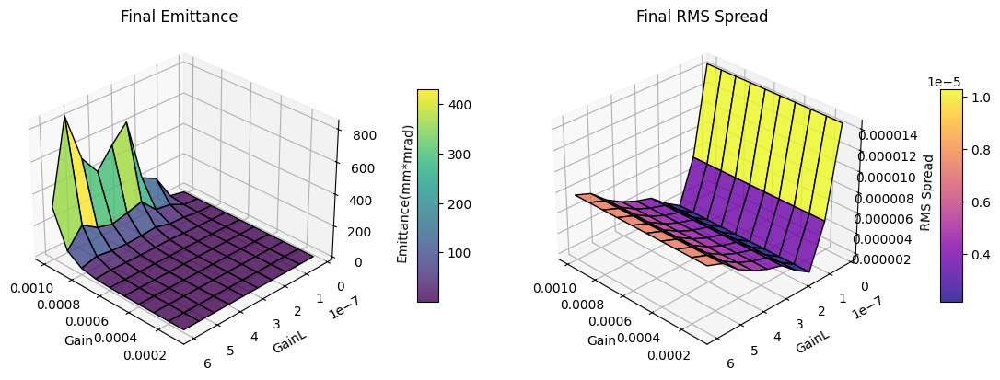

In [ ]:

#1500 particles 20000 turns
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming gain_values and gainL_values are already defined
gain_values = np.linspace(0.0001, 0.001, 10)
gainL_values = np.linspace(2e-8, 6e-7, 10)

# Create a meshgrid for plotting
G, G_L = np.meshgrid(gain_values, gainL_values)

# Extract emittance and rms spread from results
final_emittance = results[:, :, 0].T  # Transpose for correct alignment
final_rms_spread = results[:, :, 1].T

fig = plt.figure(figsize=(14, 6))  # Increased figure size

# --- First subplot: Final Emittance ---
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(G, G_L, final_emittance, cmap='viridis', edgecolor='k', alpha=0.8)
cbar1 = fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=10, pad=0.15)  # Adjust pad
ax1.set_title("Final Emittance")
ax1.set_xlabel("Gain")
ax1.set_ylabel("GainL")
ax1.set_zlabel("Emittance(mm*mrad)", labelpad=10)  # Moves the label away from the color bar

# --- Second subplot: Final RMS Spread ---
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(G, G_L, final_rms_spread, cmap='plasma', edgecolor='k', alpha=0.8)
cbar2 = fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=10, pad=0.15)  # Adjust pad
ax2.set_title("Final RMS Spread")
ax2.set_xlabel("Gain")
ax2.set_ylabel("GainL")
ax2.set_zlabel("RMS Spread", labelpad=10)  # Moves the label away from the color bar
ax2.ticklabel_format(style='plain', axis='z')

ax2.zaxis.offsetText.set_x(2.5) 
# --- Rotate the RMS Spread plot ---
ax1.view_init(elev=30, azim=135)
ax2.view_init(elev=30, azim=135)  # Adjust rotation angles

fig.subplots_adjust(wspace=0.1)  # Add horizontal space between subplots

plt.show()

In [ ]:
#1500 particles 20000 turns

best_emittance = float('inf')
best_rms_spread = float('inf')
best_emittance_params = None
best_rms_spread_params = None

# Loop through the results array
for i in range(len(gain_values)):
    for j in range(len(gainL_values)):
        final_emittance = results[i, j, 0]
        final_rms_spread = results[i, j, 1]
        
        # Check if this is the best emittance so far
        if final_emittance < best_emittance:
            best_emittance = final_emittance
            best_emittance_params = (gain_values[i], gainL_values[j])

        # Check if this is the best RMS spread so far
        if final_rms_spread < best_rms_spread:
            best_rms_spread = final_rms_spread
            best_rms_spread_params = (gain_values[i], gainL_values[j])

# Print the results for minimum emittance and minimum RMS spread
print(f"Best parameters for minimum final emittance: gain={best_emittance_params[0]}, gainL={best_emittance_params[1]}")
print(f"Minimum final emittance: {best_emittance}")

print(f"Best parameters for minimum RMS spread: gain={best_rms_spread_params[0]}, gainL={best_rms_spread_params[1]}")
print(f"Minimum RMS spread: {best_rms_spread}")

Best parameters for minimum final emittance: gain=0.0006000000000000001, gainL=2e-08
Minimum final emittance: 0.0030382201859021634
Best parameters for minimum RMS spread: gain=0.0001, gainL=1.4888888888888886e-07
Minimum RMS spread: 1.7003917647350538e-06


In [182]:
best_emittance = float('inf')
best_rms_spread = float('inf')
best_comb = float('inf')
best_emittance_params = None
best_rms_spread_params = None

# Loop through the results array
for i in range(len(gain_values)):
    for j in range(len(gainL_values)):
        final_emittance = results[i, j, 0]*1e-6
        final_rms_spread = results[i, j, 1]
        
        # Check if this is the best emittance so far
        if final_emittance + final_rms_spread< best_comb:
            best_emittance = final_emittance 
            print(best_emittance)
            best_rms_spread = final_rms_spread
            best_comb = final_emittance +final_rms_spread
            best_emittance_params = (gain_values[i], gainL_values[j])

        

# Print the results for minimum emittance and minimum RMS spread
print(f"Best parameters for emittance and rms spread: gain={best_emittance_params[0]}, gainL={best_emittance_params[1]}")
print(f"Minimum final emittance: {best_emittance}")
print(f"Minimum final rms spread: {best_rms_spread}")

3.51190666364508e-07
3.9006211557423464e-07
3.897006481901109e-07
1.557060255289848e-07
1.4069245362419563e-07
Best parameters for emittance and rms spread: gain=0.0003, gainL=1.4888888888888886e-07
Minimum final emittance: 1.4069245362419563e-07
Minimum final rms spread: 1.7003917647350538e-06


In [183]:
best_emittance = float('inf')
best_rms_spread = float('inf')
best_comb = float('inf')
best_emittance_params = None
best_rms_spread_params = None

# Loop through the results array
for i in range(len(gain_values)):
    for j in range(len(gainL_values)):
        final_emittance = results[i, j, 0]
        final_rms_spread = results[i, j, 1]
        
        # Check if this is the best emittance so far
        if final_emittance + final_rms_spread< best_comb:
            best_emittance = final_emittance 
            print(best_emittance)
            best_rms_spread = final_rms_spread
            best_comb = final_emittance +final_rms_spread
            best_emittance_params = (gain_values[i], gainL_values[j])

        

# Print the results for minimum emittance and minimum RMS spread
print(f"Best parameters for emittance and rms spread: gain={best_emittance_params[0]}, gainL={best_emittance_params[1]}")
print(f"Minimum final emittance: {best_emittance}")
print(f"Minimum final rms spread: {best_rms_spread}")

0.351190666364508
0.0726186732391967
0.01821446195758724
0.006500078331098601
0.0036855478474639445
0.0030382201859021634
Best parameters for emittance and rms spread: gain=0.0006000000000000001, gainL=2e-08
Minimum final emittance: 0.0030382201859021634
Minimum final rms spread: 1.4585824915101e-05


In [186]:
#1500 particles 20000 turns

from memory_profiler import memory_usage


mem_usage = memory_usage(lambda :Cooling(0.0006,2e-8), interval=0.1)
print(f"Peak memory usage: {max(mem_usage):.2f} MB")

========> 800 1 1.2499999999999998e-10 1e-07 25.600000000000005
The initial emittance is 1.00338162060416π mm*mrad
The final emittance after cooling is 352.7118060448997π mm*mrad
Is emittance reduced? -->  False
The initial rms_momentum_spread is 9.775054047500159e-05 
The final rms_momentum_spread after cooling is 7.802287409263729e-06 
Is rms_momentum_spread reduced? -->  True
rms_momentum_spread is reduced by 92.01816443024266%
Peak memory usage: 1134.48 MB
